**Bayesian Optimisation for hyperparameter configuration**

**Set random seed for reproducability**

In [1]:
import os
import numpy as np 
import tensorflow as tf
randseed = 42
np.random.seed(randseed)
tf.random.set_seed(randseed)
os.environ['PYTHONHASHSEED']=str(randseed)

**Import packages**

In [2]:
import pandas as pd 
import matplotlib.pyplot as plt 
from keras import backend as K
from keras.models import Sequential, load_model 
from keras.layers import Dense, Dropout, GRU 
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler  
from sklearn.metrics import  mean_squared_error, mean_absolute_error, r2_score
import skopt
from skopt import gp_minimize
from skopt.utils import use_named_args
from skopt.space import Real, Categorical, Integer

**Read in dataset**

In [3]:
#Read in the Dataset
original = pd.read_csv('/kaggle/input/stocks/FSR.csv') 
original['Date'] = pd.to_datetime(original.Date) 
original.head()

,Date,Open,High,Low,Close,Volume,Earnings Yield (EY),Dividend Yield (DY),P:E Ratio (P:E),Trades,Trade Value,Total Return Index (TRI)
0,1999-01-01,546,565,546,546,0,7.765,2.0000,12.878300,0,0,68.082755
1,1999-01-04,546,547,536,536,539932,7.882,2.0000,12.687135,0,0,66.835818
2,1999-01-05,536,548,536,546,1681254,7.765,2.0000,12.878300,0,0,68.082755
3,1999-01-06,553,621,553,620,8254865,6.824,1.7647,14.654162,0,0,77.310088
4,1999-01-07,620,663,612,621,8852081,6.824,1.7647,14.654162,0,0,77.434782


**Feature Engineering:**

*   Variations of Log Returns
*   Total Return Index (TRI)
*   Simple Moving Average (SMA) - 20, 50, 200 days
*   Exponentially-weighted Moving Average (EWMA) - 20, 50, 200 days
*   Moving Average Convergence Divergence (MACD)
*   Relative Strength Index (RSI) - 14 days
*   Moving Average Convergence Divergence (MACD)

In [4]:
forecastHorizon = 5

#Create new dataframe
df = pd.DataFrame(data = original['Date'])  

#Target Returns (Weekly)
df['Target'] = np.log(original['Close'].shift(-forecastHorizon) / original['Close'])

#Returns from the closing price
df['Returns'] = np.log((original['Close']) / original['Close'].shift(forecastHorizon))

#Lagged Variations of returns
df['Returns1'] = np.log((original['Close']) / original['Close'].shift(1))
df['Returns2'] = np.log((original['Close']) / original['Close'].shift(2))
df['Returns3'] = np.log((original['Close']) / original['Close'].shift(3))
df['Returns4'] = np.log((original['Close']) / original['Close'].shift(4))

#Simple Moving Average (SMA) and Exponentially-weighted Moving Average (EWMA) - 5, 10, 20, 50, 200 days
numDays = 5
df['SMA (5)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (5)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 10
df['SMA (10)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (10)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 20
df['SMA (20)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (20)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 50
df['SMA (50)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (50)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 200
df['SMA (200)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (200)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

#Relative Strength Index (RSI)
numDays = 14
diff = original['Close'].diff(1)
up, down = diff.copy(), diff.copy()
up[up < 0] = 0
down[down > 0] = 0
EWMAu = up.ewm(span = numDays, min_periods = numDays).mean()
EWMAd = down.abs().ewm(span = numDays, min_periods = numDays).mean()
RS = EWMAu / EWMAd
df['RSI'] = 100.0 - (100.0 / (1.0 + RS))

#Moving Average Convergence Divergence (MACD)
df['MACD'] = df['Returns'].ewm(span = 12, min_periods = 12).mean()  - df['Returns'].ewm(span = 26, min_periods = 26).mean() 

#Commodity Channel Index (CCI) 
df['Typical Price'] = (original['High'] + original['Low'] + original['Close']) / 3
numDays = 20
df['CCI'] = (df['Typical Price'] - df['Typical Price'].rolling(numDays).mean()) / (0.015 * df['Typical Price'].rolling(numDays).std())

#Stochastic Oscillator (SO)
numDays = 14
df['SO'] = ((df['Returns'] - df['Returns'].rolling(numDays).min()) / (df['Returns'].rolling(numDays).max() - df['Returns'].rolling(numDays).min())) * 100

#Variations of Returns
df['TRI'] = np.log(original['Total Return Index (TRI)'] / original['Total Return Index (TRI)'].shift(forecastHorizon))
df['Returns Open'] = np.log(original['Open'] / original['Open'].shift(forecastHorizon))
df['Returns Low'] = np.log(original['Low'] / original['Low'].shift(forecastHorizon))
df['Returns High'] = np.log(original['High'] / original['High'].shift(forecastHorizon))
df['Returns High/Open'] = np.log(original['High'] / original['Open'].shift(forecastHorizon))
df['Returns High/Low'] = np.log(original['High'] / original['Low'].shift(forecastHorizon))
df['Returns High/Close'] = np.log(original['High'] / original['Close'].shift(forecastHorizon))
df['Returns Close/Open'] = np.log(original['Close'] / original['Open'].shift(forecastHorizon))
df['Returns Close/Low'] = np.log(original['Close'] / original['Low'].shift(forecastHorizon))
df['Returns Close/High'] = np.log(original['Close'] / original['High'].shift(forecastHorizon))
df['Returns Open/Low'] = np.log(original['Open'] / original['Low'].shift(forecastHorizon))
df['Typical Price'] = np.log(df['Typical Price'] / df['Typical Price'].shift(forecastHorizon))

#Set date to index
df.index = df['Date'] 

#Drop columns that aren't needed
df.drop(['Date'], axis=1, inplace=True)

#Drop NaNs
df = df.dropna()

df.head()

,Target,Returns,Returns1,Returns2,Returns3,Returns4,SMA (5),EWMA (5),SMA (10),EWMA (10),...,Returns Open,Returns Low,Returns High,Returns High/Open,Returns High/Low,Returns High/Close,Returns Close/Open,Returns Close/Low,Returns Close/High,Returns Open/Low
Date,,,,,,,,,,,,,,,,,,,,,
1999-10-14,0.005168,-0.013722,-0.005168,-0.032288,-0.038955,-0.030615,0.043556,0.031226,0.078703,0.048465,...,0.003442,-0.013938,-0.013537,0.011997,0.015451,0.000000,-0.001726,0.001729,-0.027259,0.006897
1999-10-15,0.038133,-0.053323,-0.022708,-0.027876,-0.054997,-0.061663,0.011334,0.003043,0.064193,0.029958,...,-0.013722,-0.060625,-0.037292,-0.013722,0.001729,-0.030615,-0.036431,-0.020980,-0.060001,0.001729
1999-10-18,0.042632,-0.047628,0.014035,-0.008673,-0.013841,-0.040961,-0.012655,-0.013847,0.046281,0.015852,...,-0.053323,-0.106107,-0.063673,-0.032343,-0.030667,-0.040684,-0.039288,-0.037611,-0.070618,-0.051647
1999-10-19,0.000000,-0.005029,0.035932,0.049967,0.027259,0.022091,-0.023252,-0.010908,0.033075,0.012055,...,-0.047628,-0.051736,-0.016557,-0.004996,0.006700,0.001671,-0.011696,0.000000,-0.023257,-0.035932
1999-10-20,0.010101,0.015346,-0.006745,0.029187,0.043222,0.020514,-0.020871,-0.002157,0.023497,0.012653,...,0.006745,0.020834,0.010101,0.010101,0.046281,0.025447,0.000000,0.036180,0.000000,0.042925


**Model Helper Functions**

In [5]:
def split(dataset, sequencelength, features, scaler, start, trainingSize, validationSize, testingSize, end):
  '''
  Function to split the data into a window required for Keras RNNs
  @params:
    dataset - data to be used
    sequencelength - Number of datapoints in a single input sequence
    features - Number of features in the dataset
    scaler - Initialised MinMaxScaler
    start - First datapoint index
    trainingSize - Size of the training set
    validationSize - Size of the validation set
    testingSize - Size of the testing set
    end - Last datapoint index
  @returns:
    scaler - Scaler that is fit on the training data
    x_train - Scaled Training input 
    y_train - Scaled Training output 
    y_trainUnscaled - Unscaled training output 
    x_val - Scaled validation input 
    y_val - Scaled validation output 
    y_valUnscaled - Unscaled validation output 
    x_test - Scaled testing input 
    y_test - Unscaled testing output 
  '''
  #Extracting target variables for the test and train set
  train = scaler.fit_transform(dataset[start - sequencelength : start + trainingSize, :])
  unscaled_train = dataset[start - sequencelength : start + trainingSize , 0]

  x_train = []
  y_train = []
  y_trainUnscaled = []
  for i in range(sequencelength, len(train)):
    x_train.append(train[i - sequencelength + 1 : i + 1, 1:])
    y_train.append(train[i, 0])
    y_trainUnscaled.append(unscaled_train[i])

  x_train = np.array(x_train)
  x_train = x_train.reshape((x_train.shape[0], sequencelength, features))
  y_train = np.array(y_train)
  y_trainUnscaled = np.array(y_trainUnscaled)

  #Splitting the validation set into input and output arrays
  val = scaler.transform(dataset[start + trainingSize - sequencelength : end - testingSize, :])
  unscaled_val = dataset[start + trainingSize - sequencelength : end - testingSize , 0]

  x_val = []
  y_val = []
  y_valUnscaled = []
  for i in range(sequencelength, len(val)):
    x_val.append(val[i - sequencelength + 1 : i + 1, 1:])
    y_val.append(val[i, 0])
    y_valUnscaled.append(unscaled_val[i])

  x_val = np.array(x_val)
  x_val = x_val.reshape((x_val.shape[0], sequencelength, features))
  y_val = np.array(y_val)
  y_valUnscaled = np.array(y_valUnscaled)

  #Splitting the testing set into input an array
  test = scaler.transform(dataset[start + trainingSize + validationSize - sequencelength : end, :])
  unscaled_test = dataset[start + trainingSize + validationSize - sequencelength : end, 0]

  x_test = []
  y_test = []
  for i in range(sequencelength, len(test)):
    x_test.append(test[i - sequencelength + 1 : i + 1, 1:])
    y_test.append(unscaled_test[i])

  x_test = np.array(x_test) 
  x_test = x_test.reshape((x_test.shape[0], sequencelength, features))
  y_test = np.array(y_test)

  return scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test

def makePredictions(model, x_train, x_val, x_test, sequencelength, scaler):
  '''
  Performs inference using the model
  @params:
    model - LSTM or GRU (Keras Framework)
    x_train - Training input data
    x_val - Validation input data
    x_test - Testing input data
    sequencelength - Input sequence length
    scaler - MinMaxScaler used to scale the data
  @returns:
    trainingPredictions - Training set predictions
    valPredictions - Validation set predictions
    testingPredictions - Testing set predictions
  '''
  #Forecasts on training set
  temp = x_train
  trainingPredictions = model.predict(x_train)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((trainingPredictions, temp[:,:features]), axis=1)
  trainingPredictions = scaler.inverse_transform(invPred)[:,0]
  trainingPredictions = trainingPredictions.reshape((trainingPredictions.shape[0], 1))

  #Forecasts on validation set
  temp = x_val
  valPredictions = model.predict(x_val)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((valPredictions, temp[:,:features]), axis=1)
  valPredictions = scaler.inverse_transform(invPred)[:,0]
  valPredictions = valPredictions.reshape((valPredictions.shape[0], 1))

  #Forecasts on test set
  temp = x_test
  testingPredictions = model.predict(x_test)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((testingPredictions, temp[:,:features]), axis=1)
  testingPredictions = scaler.inverse_transform(invPred)[:,0]
  testingPredictions = testingPredictions.reshape((testingPredictions.shape[0], 1))

  return trainingPredictions, valPredictions, testingPredictions

**Parameters for the dataset split**

In [6]:
dataset = df.values
totaldatapoints = len(dataset)
features = len(df.columns) - 1

**Setting up hyperparameter ranges**

In [7]:
dim_learning_rate = Real(low=1e-4, high=1e-2, prior='log-uniform', name='learning_rate')
dim_num_input_nodes = Integer(low=5, high=256, name='num_input_nodes')
dim_dropout = Real(low=0.0,high=0.25,name='dropout')
dim_sequence_length = Integer(low=100, high=200, name='sequence_length')
dim_batch_size = Integer(low=1, high=250, name='batch_size')

dimensions = [dim_learning_rate,
              dim_num_input_nodes,
              dim_dropout,
              dim_sequence_length,
              dim_batch_size]

default_parameters = [3e-4, 256, 0.2, 200, 32]

**GRU initialisation based on current set of hyperparameters**

In [8]:
def gru(learning_rate, num_input_nodes, dropout, sequence_length):
  '''
  Create GRU
  @params: 
    learning_rate - Adam learning rate
    num_input_nodes - Number of GRU cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
  @returns:
    model - Compiled GRU
  '''
  #Construct GRU
  model = Sequential()
  model.add(GRU(units=num_input_nodes, return_sequences=True, input_shape=(sequence_length, features)))
  model.add(GRU(units=num_input_nodes, dropout=dropout))
  model.add(Dense(1))

  adam = Adam(lr=learning_rate, amsgrad=True)
  model.compile(optimizer=adam, loss='mae', metrics=['mse','mae','mape'])
  return model

**Train GRU with current hyperparameters**

In [9]:
@use_named_args(dimensions=dimensions)
def fitness(learning_rate, num_input_nodes, dropout, sequence_length, batch_size):
  '''
  Used in the Bayesian Optimisation Procedure
  @params:
    learning_rate - Adam learning rate
    num_input_nodes - Number of GRU cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
    batch_size - Model batch size
  @returns:
    mse - Mean squared Error using current hyperparameters
  '''
  #Get train, val, test split
  #Window Variables
  start = 0 + sequence_length
  trainingSize = 1000
  validationSize = 100
  testingSize = 150
  end = start + trainingSize + validationSize + testingSize + sequence_length

  #Get Data split
  scaler = MinMaxScaler(feature_range=(-1, 1))
  scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test = split(dataset, sequence_length, features, scaler, start, trainingSize, validationSize, testingSize, end)
  
  print()
  print('learning rate: {}'.format(learning_rate))
  print('num_input_nodes: {}'.format(num_input_nodes))
  print('dropout: {}'.format(dropout))
  print('sequence_length : {}'.format(sequence_length))
  print('batch_size: {}'.format(batch_size))
  print()

  model = gru(learning_rate=learning_rate,
               num_input_nodes=num_input_nodes,
               dropout=dropout,
               sequence_length=sequence_length)
  
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)
  mc = ModelCheckpoint('./GRU.h5', monitor='val_loss', mode='min', verbose=0, save_best_only=True)
  blackbox = model.fit(x_train, y_train,  batch_size=batch_size, epochs=150, verbose=0, validation_data = (x_val, y_val), callbacks=[es, mc])
  model = load_model('./GRU.h5')
  
  _, _, testingPredictions = makePredictions(model, x_train, x_val, x_test, sequence_length, scaler)

  #Plot graph of forecasts
  testGraph = pd.DataFrame(df[start + trainingSize + validationSize : end])
  testGraph['Test Predictions'] = testingPredictions
  testGraph['Test Actual'] = y_test

  plt.figure(figsize=(16,8))
  plt.plot(testGraph['Test Actual'], label='True values')
  plt.plot(testGraph['Test Predictions'], label = 'Predicted Values')
  plt.title("Result")
  plt.legend(loc = 'best')
  plt.show()

  #Get mse on the test set
  mse = mean_squared_error(y_test, testingPredictions)

  # Print the classification accuracy.
  print()
  print("MSE: {}".format(mse))
  print()

  del model
  K.clear_session()
  tf.compat.v1.reset_default_graph()
  return mse

**Bayesian Optimisation**

Iteration No: 1 started. Evaluating function at provided point.

learning rate: 0.0003
num_input_nodes: 256
dropout: 0.2
sequence_length : 200
batch_size: 32



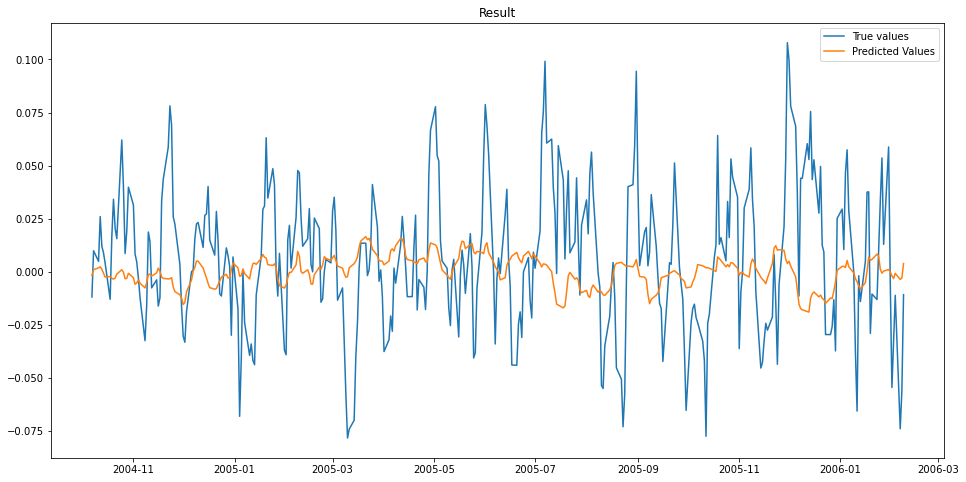


MSE: 0.0012012015390161605

Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 35.4466
Function value obtained: 0.0012
Current minimum: 0.0012
Iteration No: 2 started. Evaluating function at random point.

learning rate: 0.003918194347141745
num_input_nodes: 51
dropout: 0.19492275006819237
sequence_length : 160
batch_size: 112



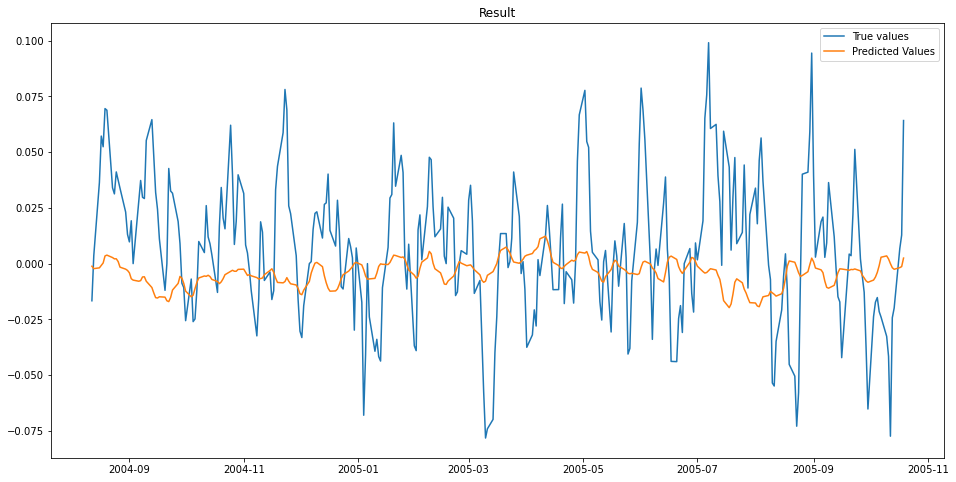


MSE: 0.0011712036414859496

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 12.1849
Function value obtained: 0.0012
Current minimum: 0.0012
Iteration No: 3 started. Evaluating function at random point.

learning rate: 0.00015847101210439096
num_input_nodes: 120
dropout: 0.08342715278475547
sequence_length : 114
batch_size: 163



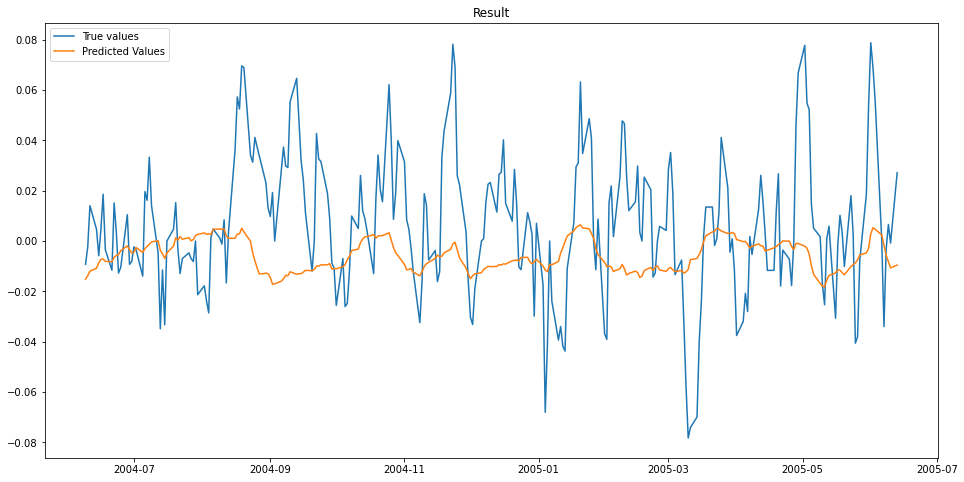


MSE: 0.0008985330851534856

Iteration No: 3 ended. Evaluation done at random point.
Time taken: 9.0736
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 4 started. Evaluating function at random point.

learning rate: 0.00012966511753760403
num_input_nodes: 186
dropout: 0.2346381772539376
sequence_length : 100
batch_size: 248



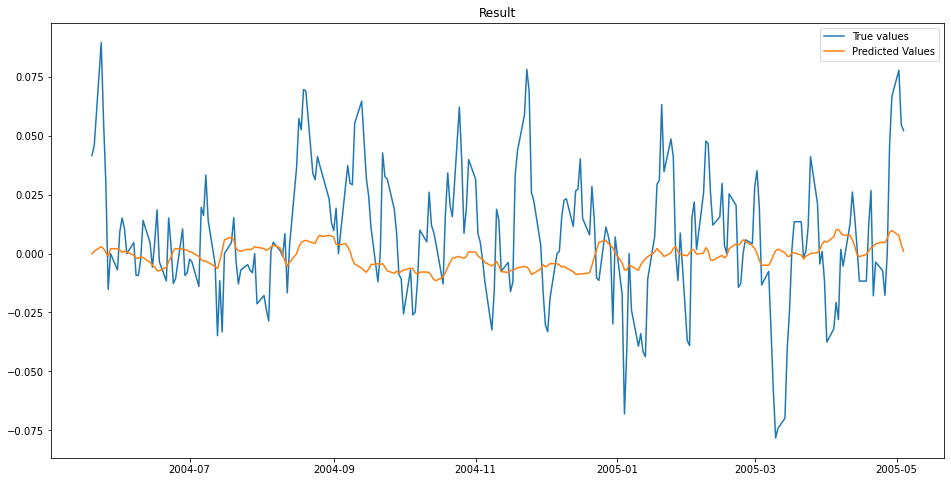


MSE: 0.0008376477653935301

Iteration No: 4 ended. Evaluation done at random point.
Time taken: 12.1298
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 5 started. Evaluating function at random point.

learning rate: 0.0017177621112338384
num_input_nodes: 159
dropout: 0.001766576304929352
sequence_length : 102
batch_size: 132



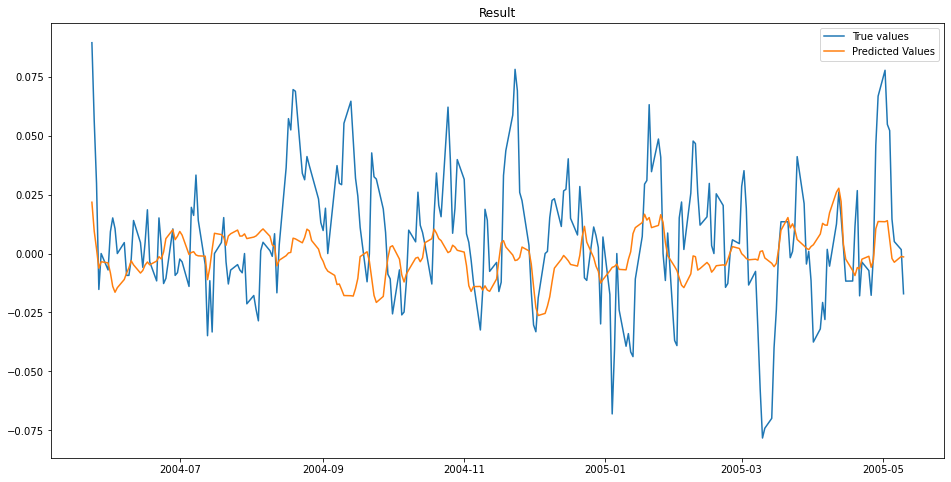


MSE: 0.0008286573859040367

Iteration No: 5 ended. Evaluation done at random point.
Time taken: 17.3229
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 6 started. Evaluating function at random point.

learning rate: 0.0006305535040199287
num_input_nodes: 17
dropout: 0.24343887971036485
sequence_length : 123
batch_size: 24



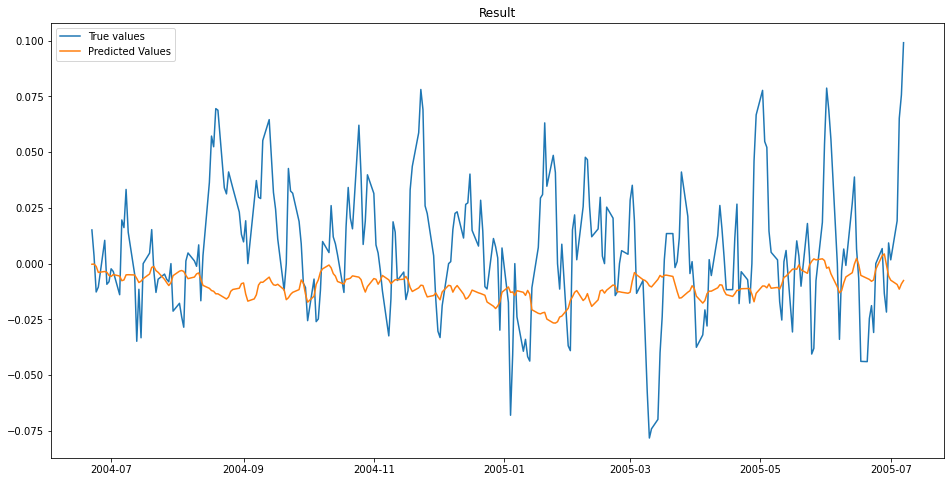


MSE: 0.0011800936881035803

Iteration No: 6 ended. Evaluation done at random point.
Time taken: 21.8253
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 7 started. Evaluating function at random point.

learning rate: 0.0017249321573178998
num_input_nodes: 101
dropout: 0.2458077214516971
sequence_length : 147
batch_size: 215



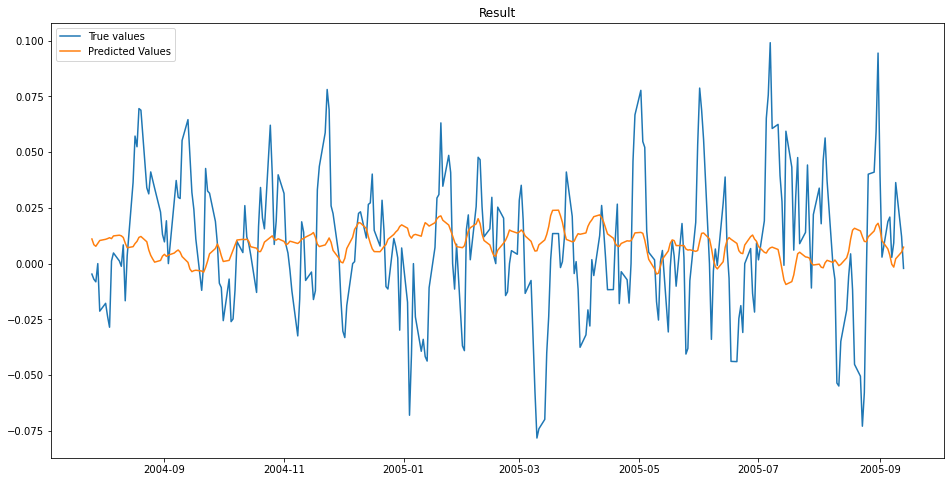


MSE: 0.001004943208932776

Iteration No: 7 ended. Evaluation done at random point.
Time taken: 11.4175
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 8 started. Evaluating function at random point.

learning rate: 0.0022941144328643983
num_input_nodes: 118
dropout: 0.003316240289966633
sequence_length : 194
batch_size: 141



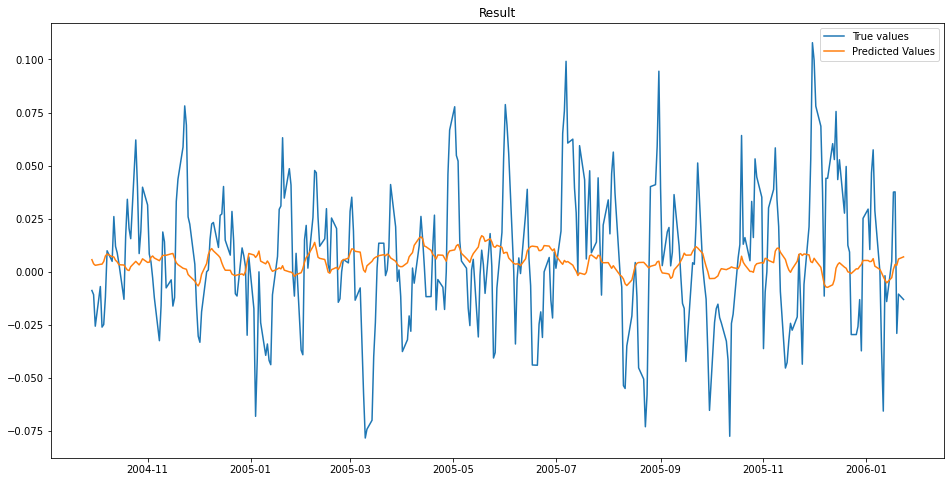


MSE: 0.0011062679906464908

Iteration No: 8 ended. Evaluation done at random point.
Time taken: 16.1317
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 9 started. Evaluating function at random point.

learning rate: 0.0005899741796710488
num_input_nodes: 9
dropout: 0.05772345640553726
sequence_length : 124
batch_size: 171



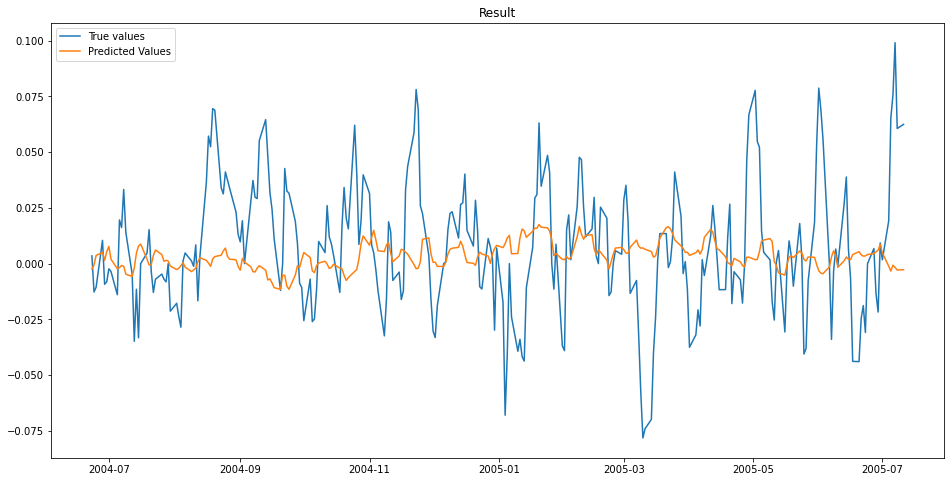


MSE: 0.0009450425303809044

Iteration No: 9 ended. Evaluation done at random point.
Time taken: 11.7982
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 10 started. Evaluating function at random point.

learning rate: 0.0016595613641357258
num_input_nodes: 214
dropout: 0.04334116337694303
sequence_length : 139
batch_size: 46



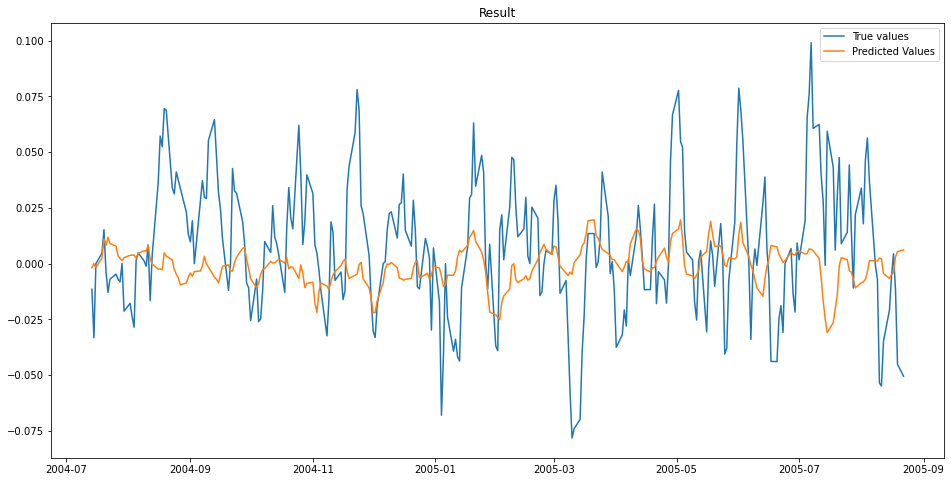


MSE: 0.0010082459225561164

Iteration No: 10 ended. Evaluation done at random point.
Time taken: 37.1297
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 11 started. Evaluating function at random point.

learning rate: 0.0032413268041956303
num_input_nodes: 112
dropout: 0.05198541571704722
sequence_length : 157
batch_size: 9



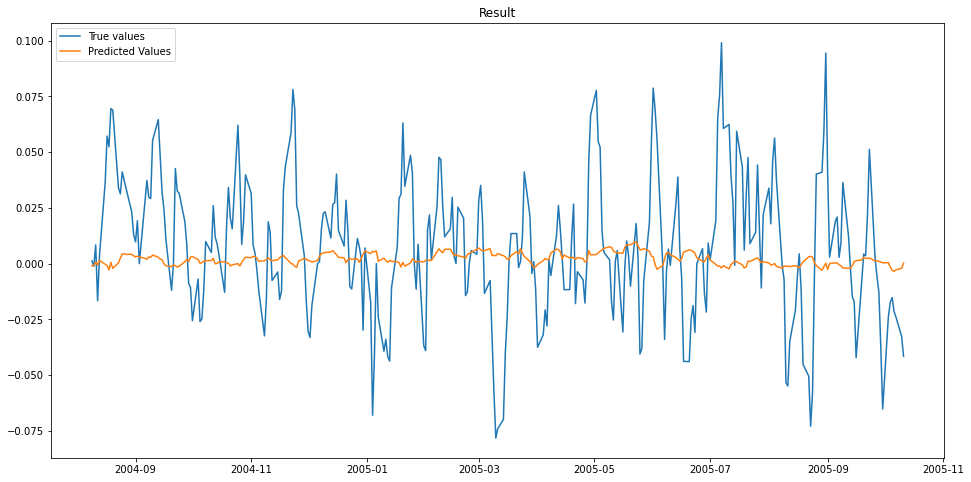


MSE: 0.0010435745050644582

Iteration No: 11 ended. Evaluation done at random point.
Time taken: 49.6066
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 12 started. Evaluating function at random point.

learning rate: 0.004836927180682221
num_input_nodes: 227
dropout: 0.18507824608274567
sequence_length : 163
batch_size: 20



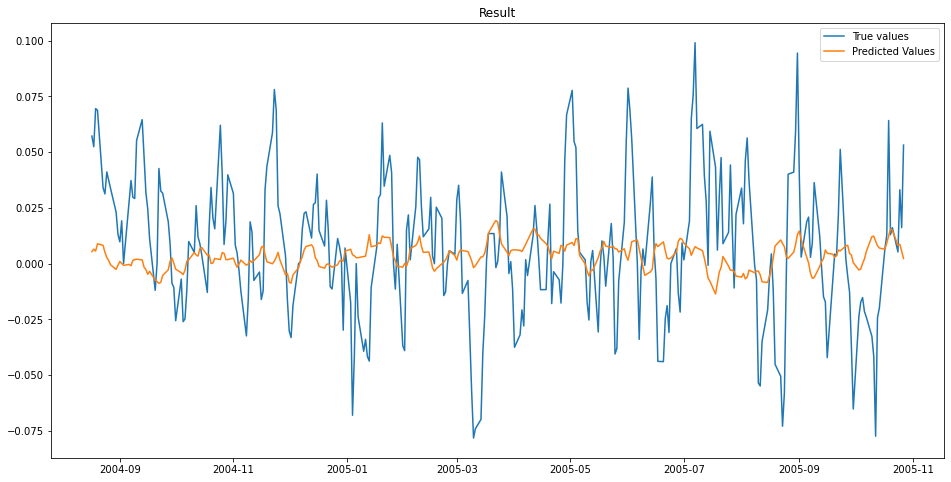


MSE: 0.0010437525780377995

Iteration No: 12 ended. Evaluation done at random point.
Time taken: 56.3526
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 13 started. Searching for the next optimal point.

learning rate: 0.0011055354209093056
num_input_nodes: 247
dropout: 0.23961521562344856
sequence_length : 105
batch_size: 66



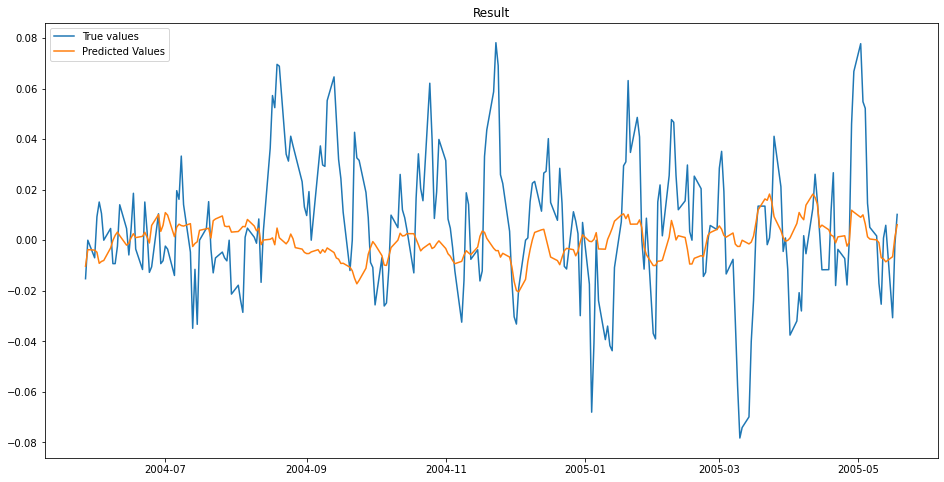


MSE: 0.0007588406457699776

Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 24.7402
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 14 started. Searching for the next optimal point.

learning rate: 0.0002050670804560787
num_input_nodes: 240
dropout: 0.23434029225351388
sequence_length : 141
batch_size: 44



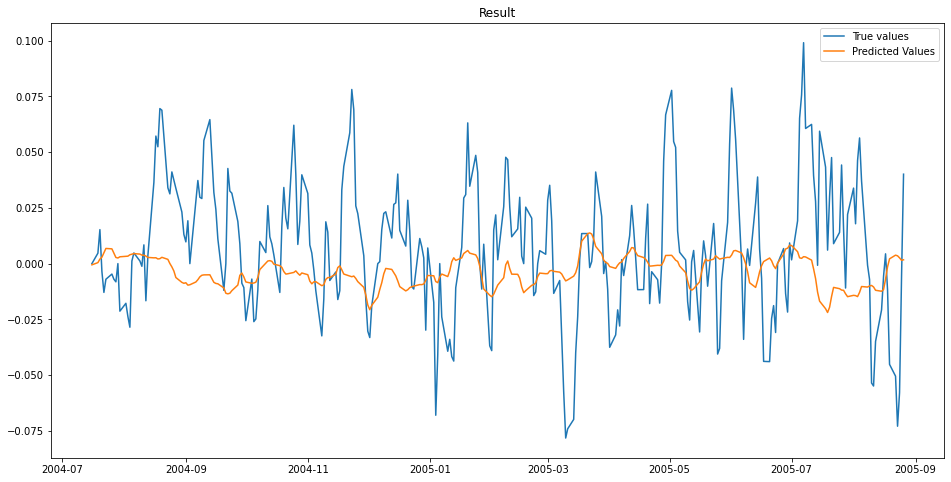


MSE: 0.001073893081129998

Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 19.8355
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 15 started. Searching for the next optimal point.

learning rate: 0.00010993676976866407
num_input_nodes: 98
dropout: 0.19810399992331712
sequence_length : 151
batch_size: 140



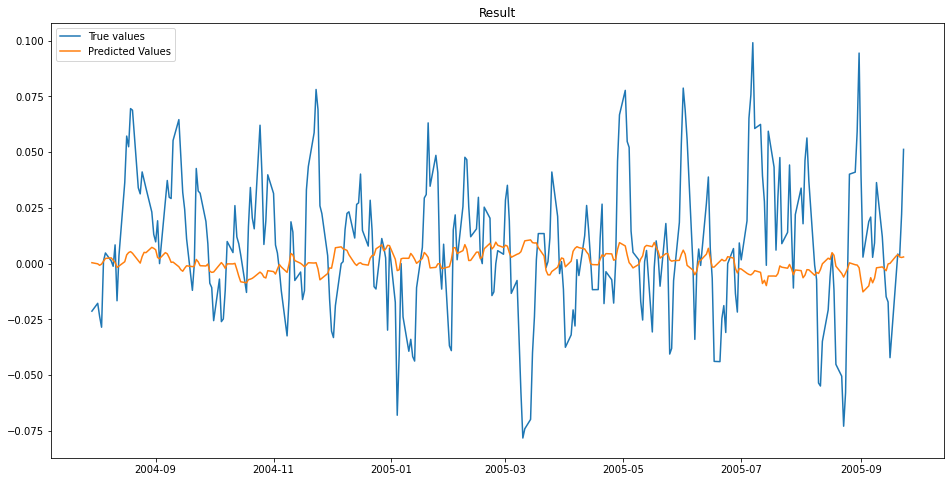


MSE: 0.0010568702601839335

Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 13.2436
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 16 started. Searching for the next optimal point.

learning rate: 0.0001040887456555644
num_input_nodes: 228
dropout: 0.1383620356395441
sequence_length : 150
batch_size: 41



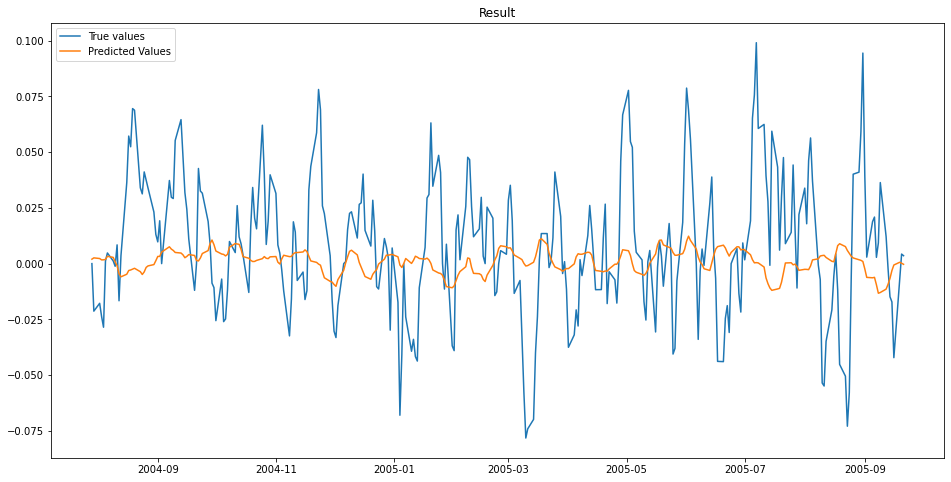


MSE: 0.0010592206932979822

Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 23.7517
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 17 started. Searching for the next optimal point.

learning rate: 0.0028432579235393727
num_input_nodes: 172
dropout: 0.006246422829997629
sequence_length : 198
batch_size: 119



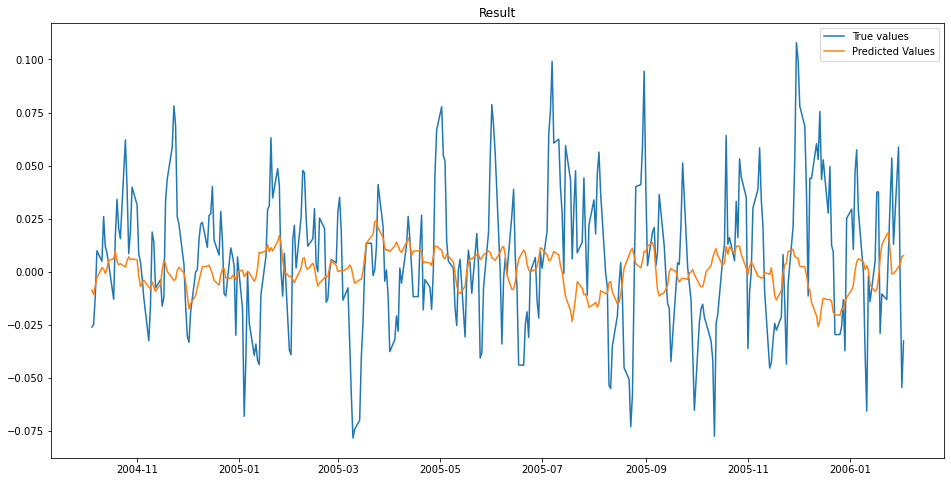


MSE: 0.0012093752927710005

Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 17.1925
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 18 started. Searching for the next optimal point.

learning rate: 0.003025011270718518
num_input_nodes: 256
dropout: 0.0
sequence_length : 100
batch_size: 151



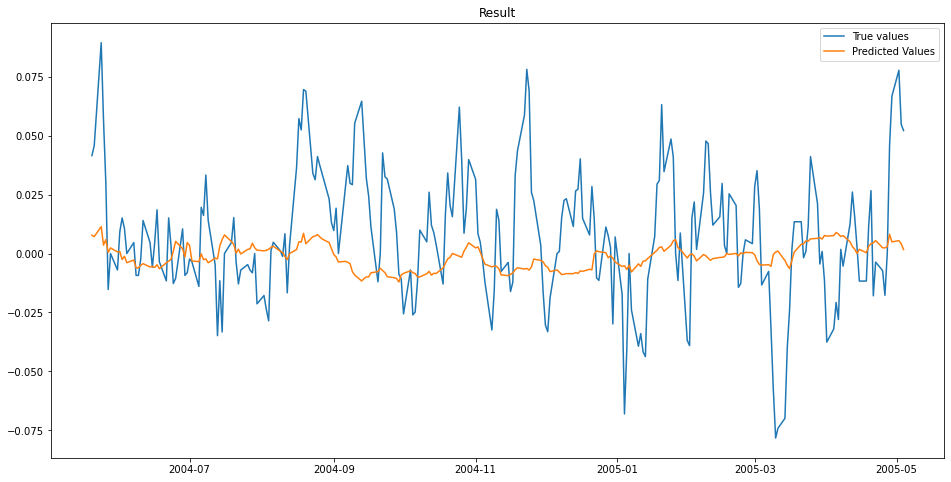


MSE: 0.0008374722894041681

Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 11.7273
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 19 started. Searching for the next optimal point.

learning rate: 0.00022932773447017663
num_input_nodes: 76
dropout: 0.25
sequence_length : 100
batch_size: 1



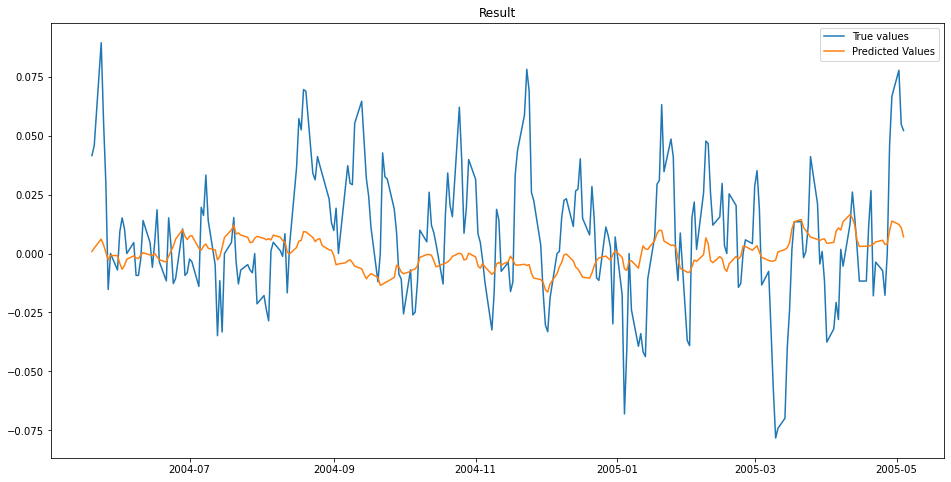


MSE: 0.0008136338415593614

Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 203.4363
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 20 started. Searching for the next optimal point.

learning rate: 0.00020731712542230353
num_input_nodes: 245
dropout: 0.25
sequence_length : 100
batch_size: 114



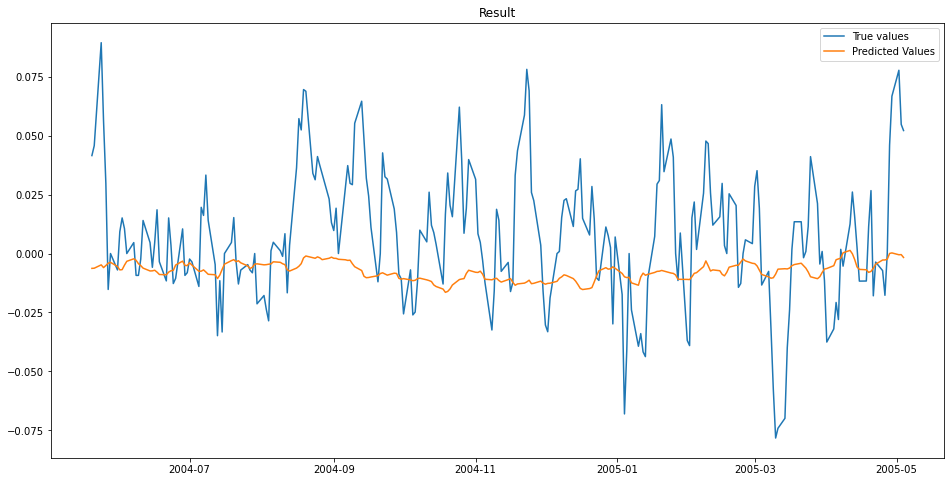


MSE: 0.0009720177688633453

Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 14.6320
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 21 started. Searching for the next optimal point.

learning rate: 0.001813882313811881
num_input_nodes: 37
dropout: 0.006354915165409066
sequence_length : 100
batch_size: 220



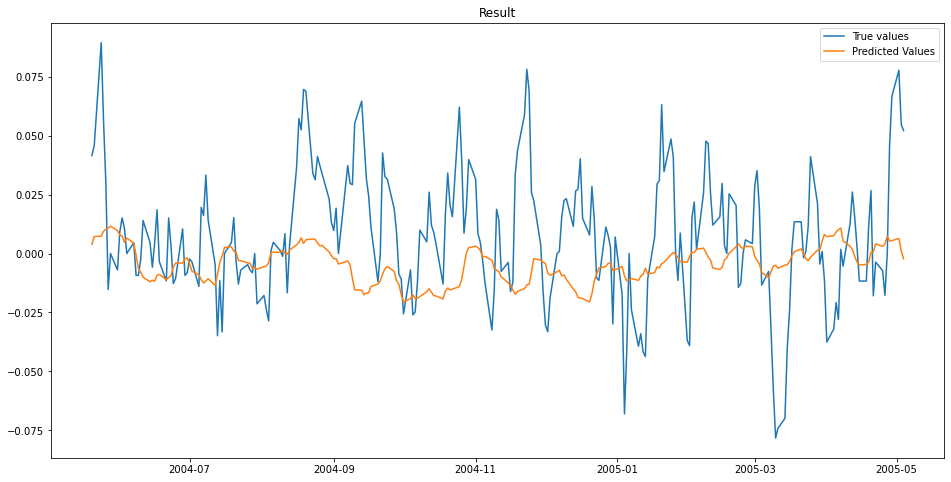


MSE: 0.0009386588156647695

Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 9.1106
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 22 started. Searching for the next optimal point.

learning rate: 0.002039658180628112
num_input_nodes: 256
dropout: 0.14731044309396718
sequence_length : 100
batch_size: 25



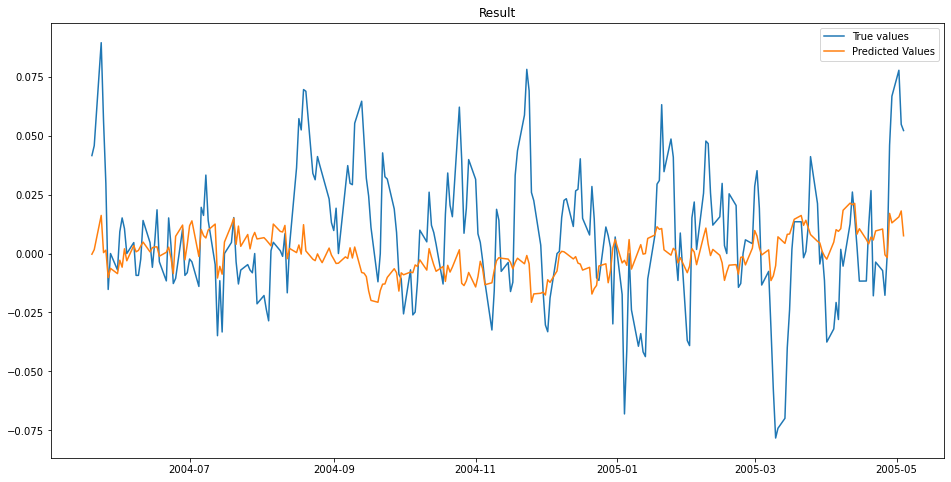


MSE: 0.0008320936967131906

Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 21.0005
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 23 started. Searching for the next optimal point.

learning rate: 0.0008702141964891654
num_input_nodes: 114
dropout: 0.21218122653025484
sequence_length : 123
batch_size: 245



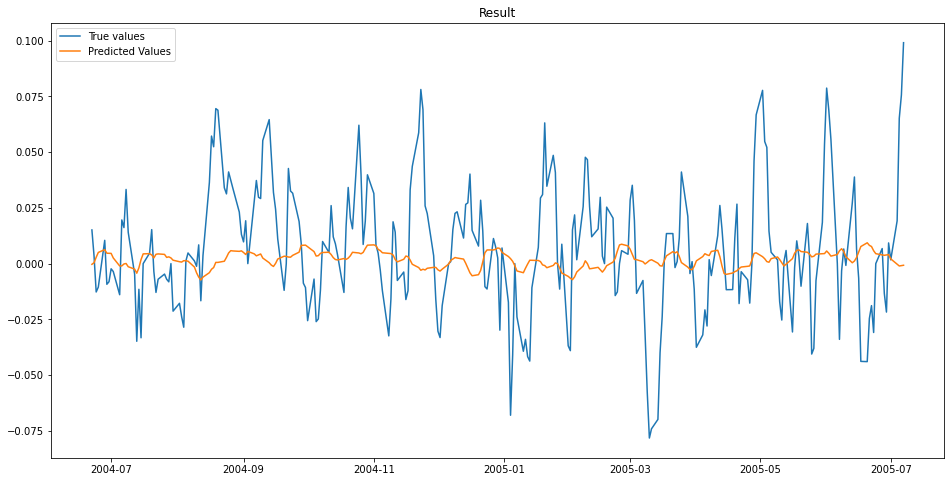


MSE: 0.0008849166367208372

Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 13.3441
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 24 started. Searching for the next optimal point.

learning rate: 0.007717789864223419
num_input_nodes: 256
dropout: 0.04037279124798814
sequence_length : 100
batch_size: 240



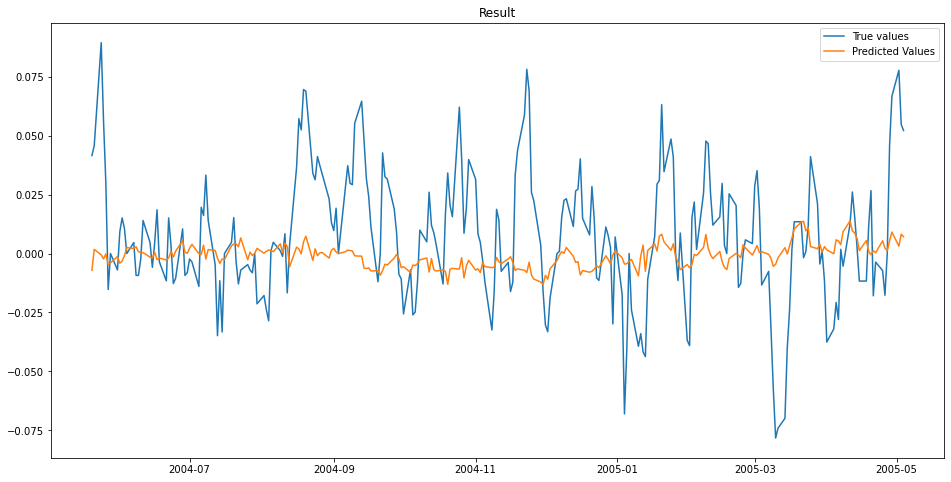


MSE: 0.000828940561406711

Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 11.8950
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 25 started. Searching for the next optimal point.

learning rate: 0.0002858844098343165
num_input_nodes: 124
dropout: 0.19871927528155914
sequence_length : 112
batch_size: 17



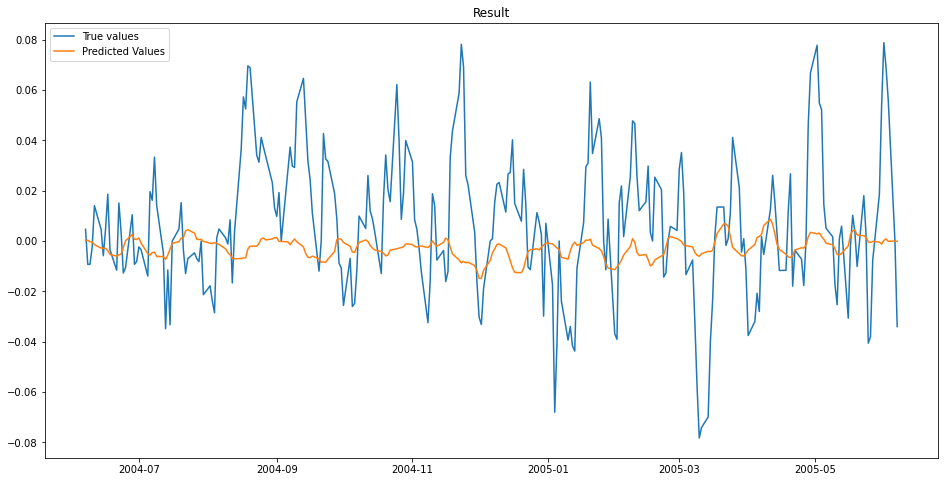


MSE: 0.0008548530343416897

Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 27.8735
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 26 started. Searching for the next optimal point.

learning rate: 0.007106891138545723
num_input_nodes: 256
dropout: 3.154604768954928e-05
sequence_length : 100
batch_size: 111



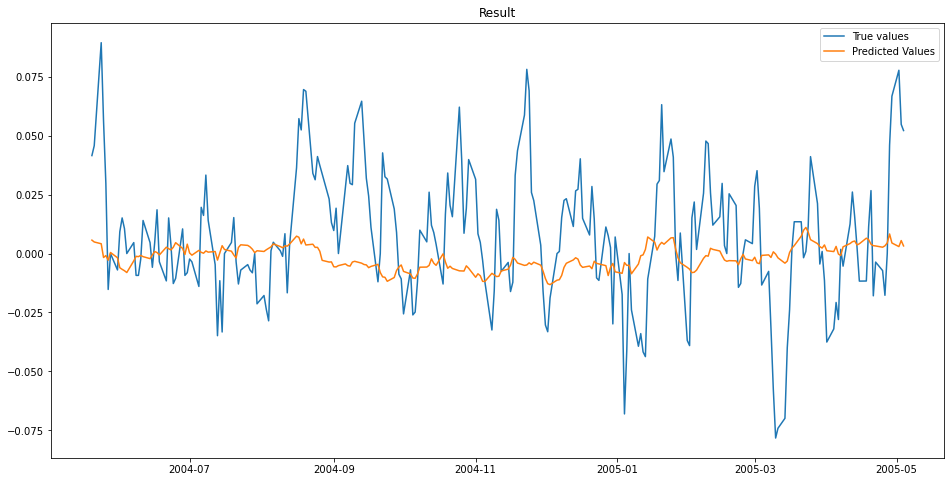


MSE: 0.00084282267700789

Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 14.6510
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 27 started. Searching for the next optimal point.

learning rate: 0.00391989751341379
num_input_nodes: 67
dropout: 0.22209883733973426
sequence_length : 161
batch_size: 144



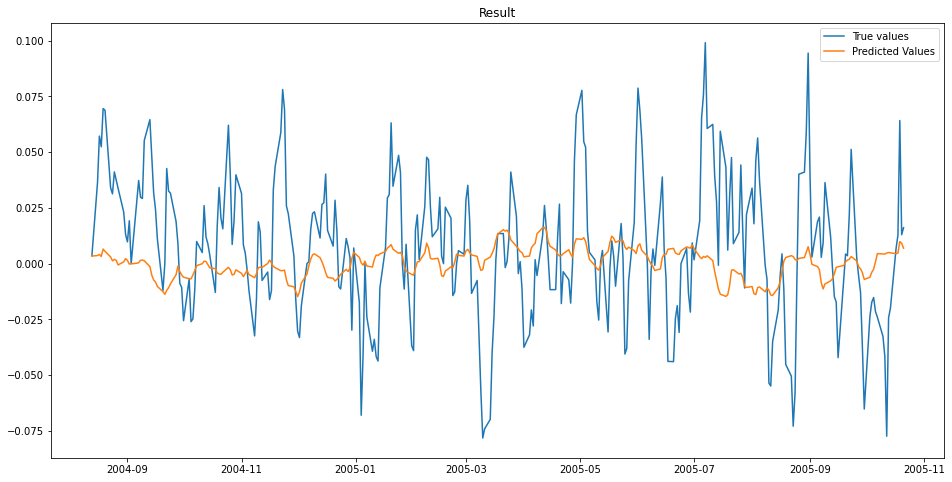


MSE: 0.001065985226918269

Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 12.9090
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 28 started. Searching for the next optimal point.

learning rate: 0.0022506529857244336
num_input_nodes: 161
dropout: 0.08522162464234627
sequence_length : 155
batch_size: 198



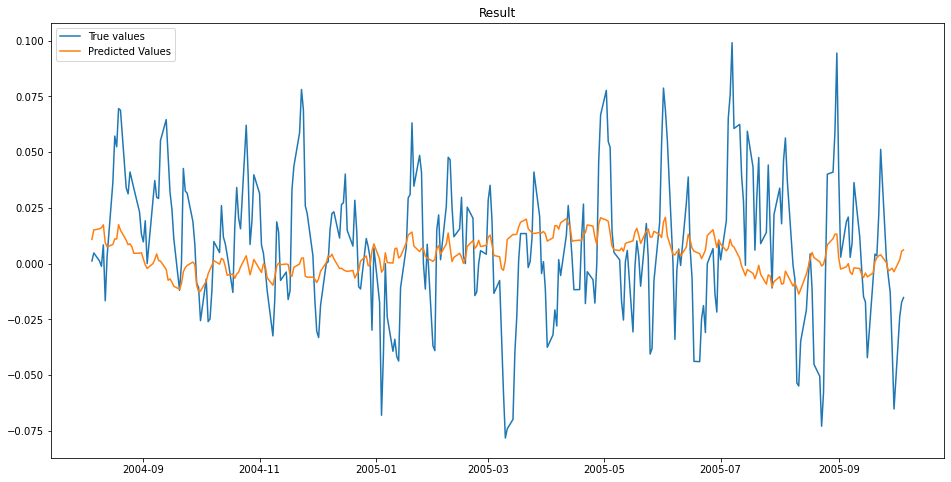


MSE: 0.0009616735668978635

Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 14.6209
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 29 started. Searching for the next optimal point.

learning rate: 0.00043407796537720076
num_input_nodes: 207
dropout: 0.05111844448881574
sequence_length : 187
batch_size: 195



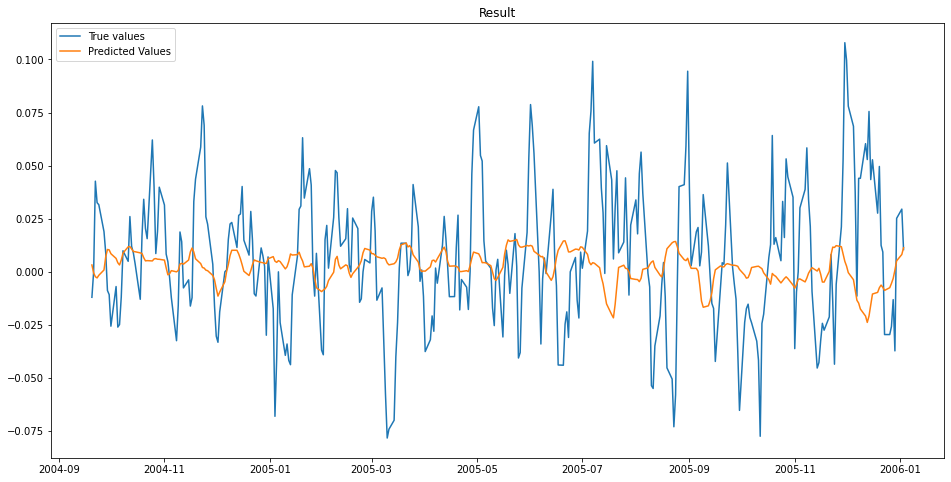


MSE: 0.001222886323742877

Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 22.9439
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 30 started. Searching for the next optimal point.

learning rate: 0.0020071857054210717
num_input_nodes: 53
dropout: 0.15903945320548288
sequence_length : 110
batch_size: 151



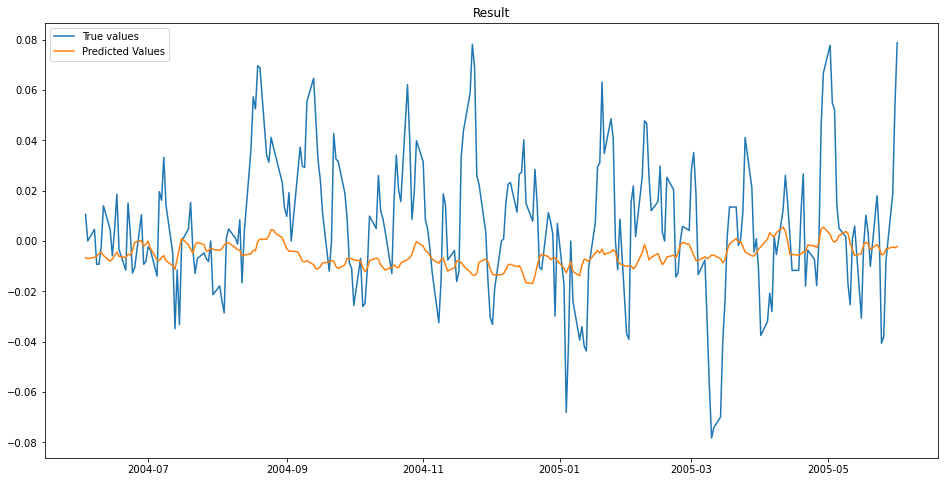


MSE: 0.0008762553043074586

Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 10.5760
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 31 started. Searching for the next optimal point.

learning rate: 0.0017560590100163395
num_input_nodes: 197
dropout: 0.1088747643186341
sequence_length : 121
batch_size: 65



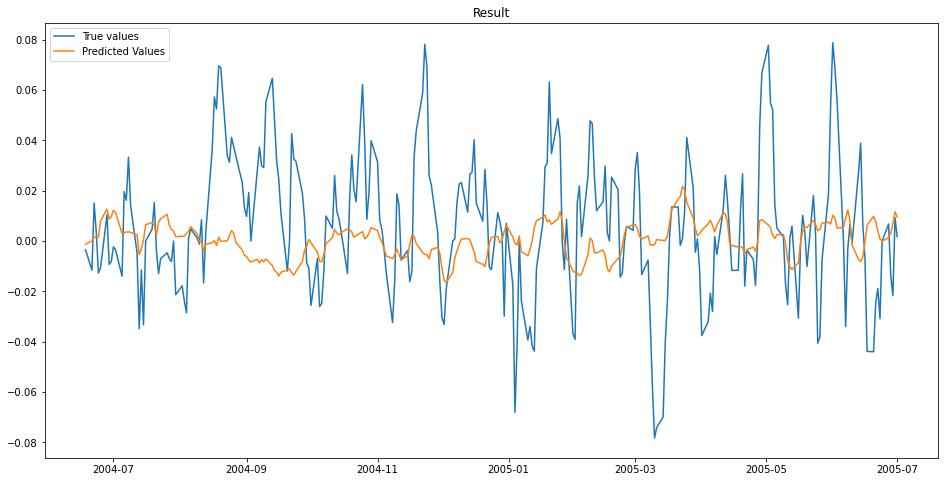


MSE: 0.0008462790773926944

Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 23.0388
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 32 started. Searching for the next optimal point.

learning rate: 0.0008633902007401385
num_input_nodes: 127
dropout: 0.008028454523932834
sequence_length : 176
batch_size: 126



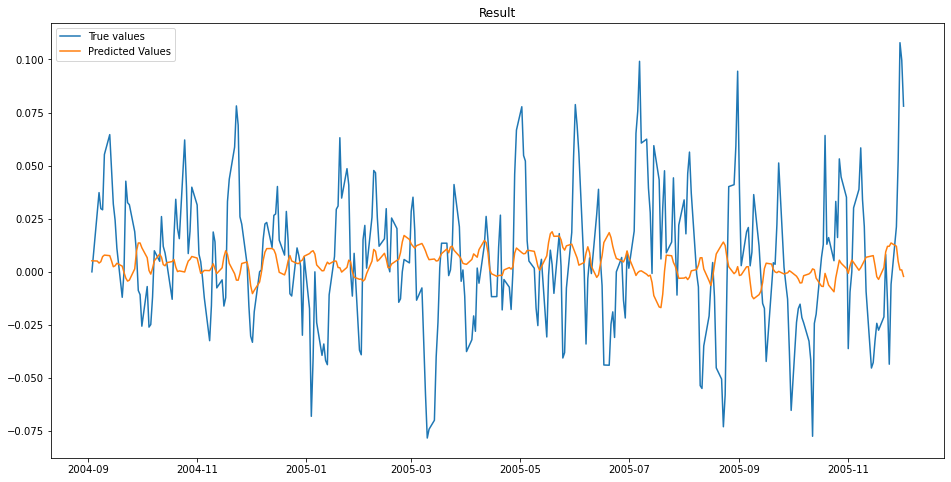


MSE: 0.0011707399965246365

Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 19.0557
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 33 started. Searching for the next optimal point.

learning rate: 0.0003125732810502738
num_input_nodes: 52
dropout: 0.11887285405944947
sequence_length : 158
batch_size: 179



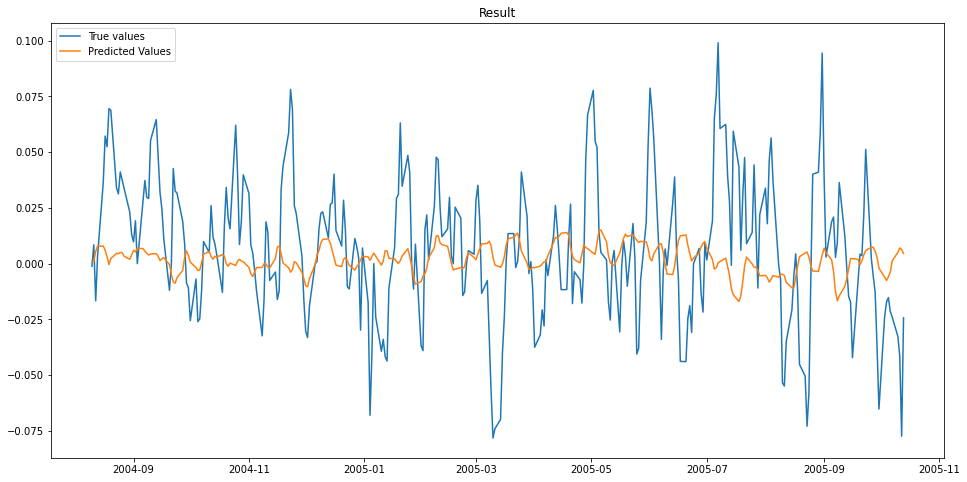


MSE: 0.001080885491346221

Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 10.0688
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 34 started. Searching for the next optimal point.

learning rate: 0.00022184183289896374
num_input_nodes: 96
dropout: 0.011921636836763397
sequence_length : 129
batch_size: 205



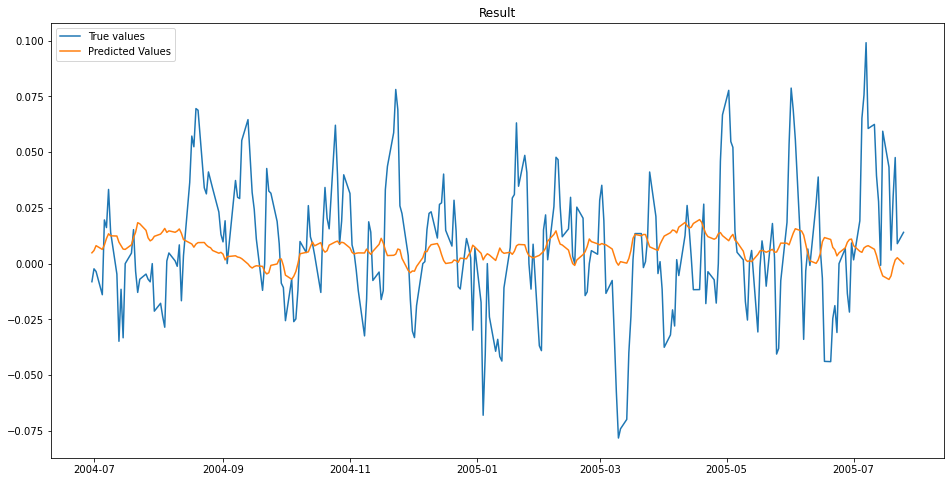


MSE: 0.0008808067989318109

Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 9.2814
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 35 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 158
dropout: 0.15099197151812818
sequence_length : 100
batch_size: 220



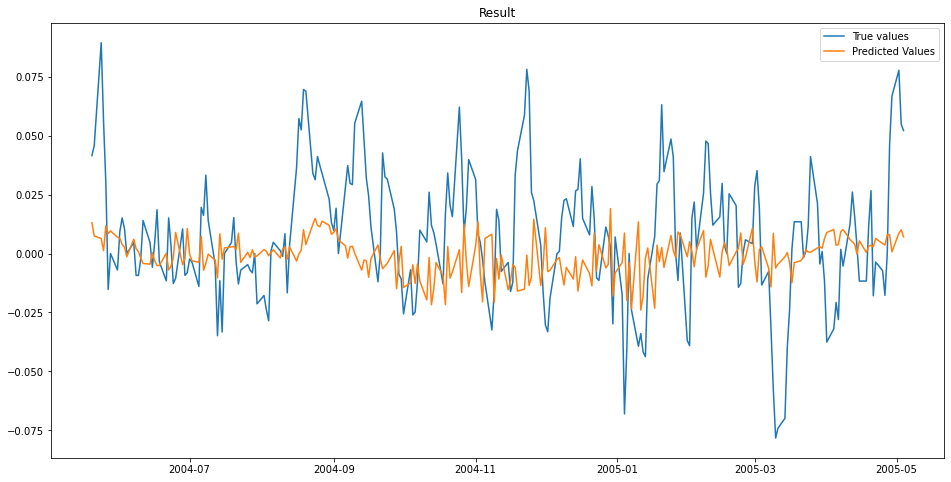


MSE: 0.0008756389110154052

Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 10.8725
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 36 started. Searching for the next optimal point.

learning rate: 0.003672452365179003
num_input_nodes: 256
dropout: 0.0
sequence_length : 118
batch_size: 250



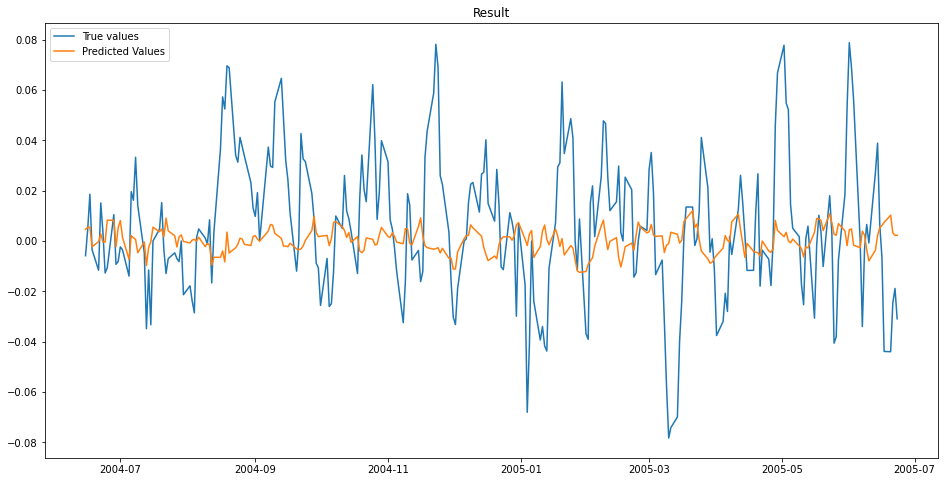


MSE: 0.000837322461608997

Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 11.2847
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 37 started. Searching for the next optimal point.

learning rate: 0.004584621670490725
num_input_nodes: 256
dropout: 0.0
sequence_length : 108
batch_size: 1



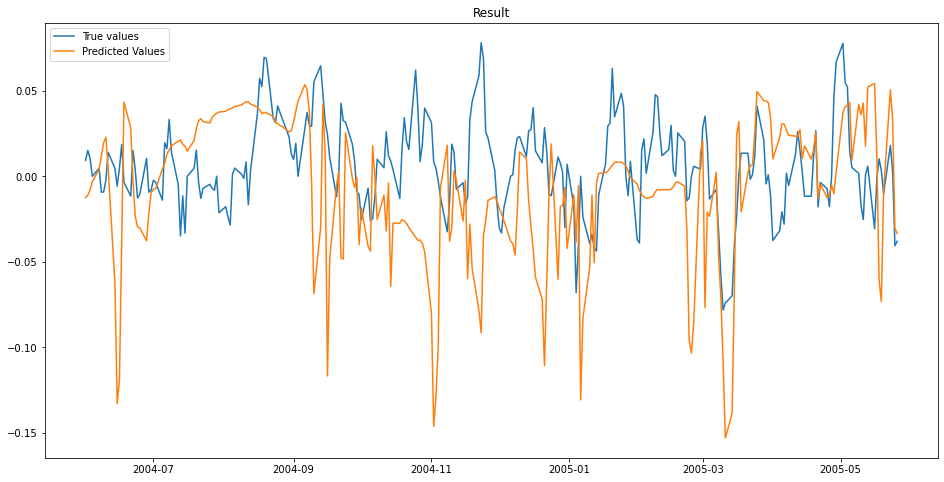


MSE: 0.0023741098403278487

Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 254.5912
Function value obtained: 0.0024
Current minimum: 0.0008
Iteration No: 38 started. Searching for the next optimal point.

learning rate: 0.001385168775294796
num_input_nodes: 149
dropout: 0.04594948359045937
sequence_length : 114
batch_size: 57



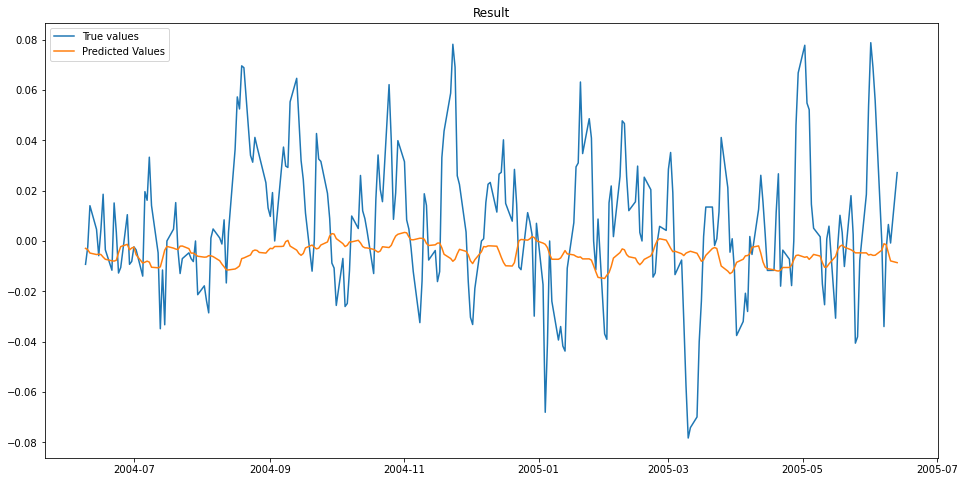


MSE: 0.0009163611616244808

Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 18.2092
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 39 started. Searching for the next optimal point.

learning rate: 0.0001272670244717577
num_input_nodes: 253
dropout: 0.21949804182485616
sequence_length : 199
batch_size: 245



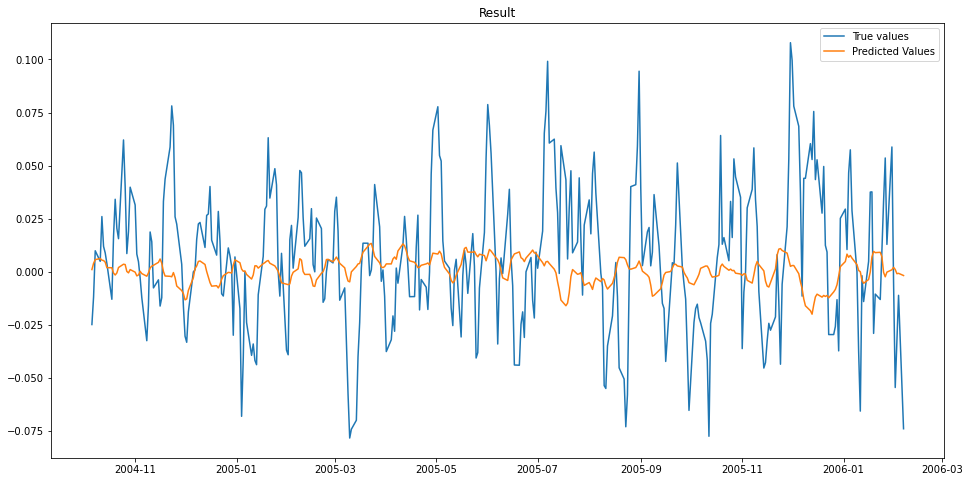


MSE: 0.0012052613848798682

Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 24.9808
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 40 started. Searching for the next optimal point.

learning rate: 0.0011299703374935853
num_input_nodes: 47
dropout: 0.011428526027543242
sequence_length : 199
batch_size: 242



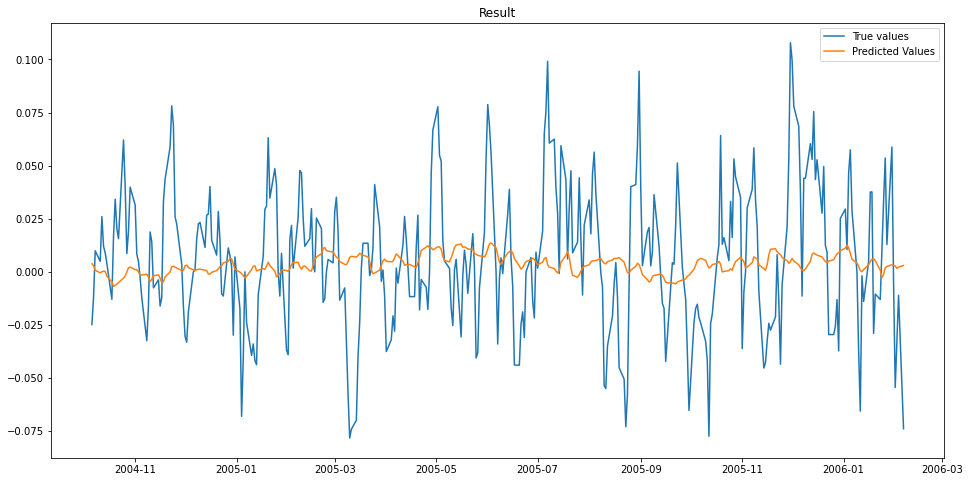


MSE: 0.0011495181137999744

Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 11.9351
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 41 started. Searching for the next optimal point.

learning rate: 0.0001520089287756726
num_input_nodes: 10
dropout: 0.0029777420879378855
sequence_length : 198
batch_size: 4



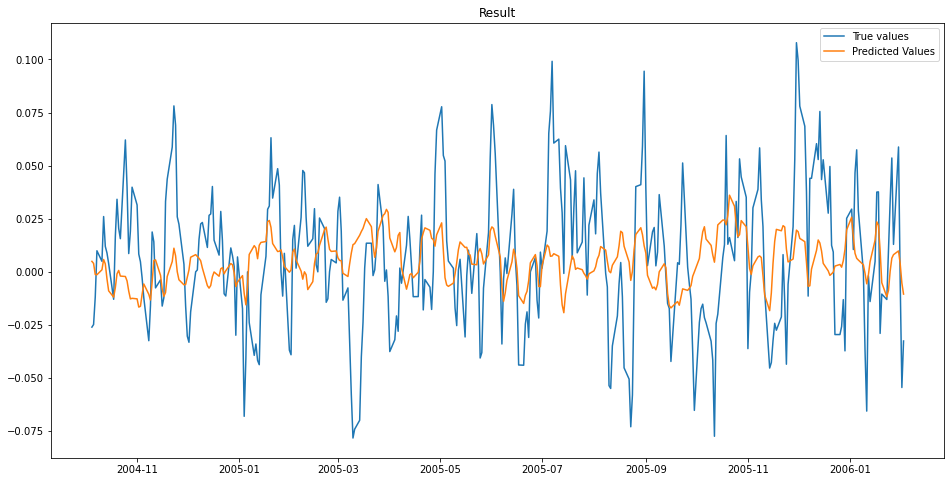


MSE: 0.00110262256827401

Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 75.2607
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 42 started. Searching for the next optimal point.

learning rate: 0.006257393327206118
num_input_nodes: 86
dropout: 0.12898899378067608
sequence_length : 178
batch_size: 185



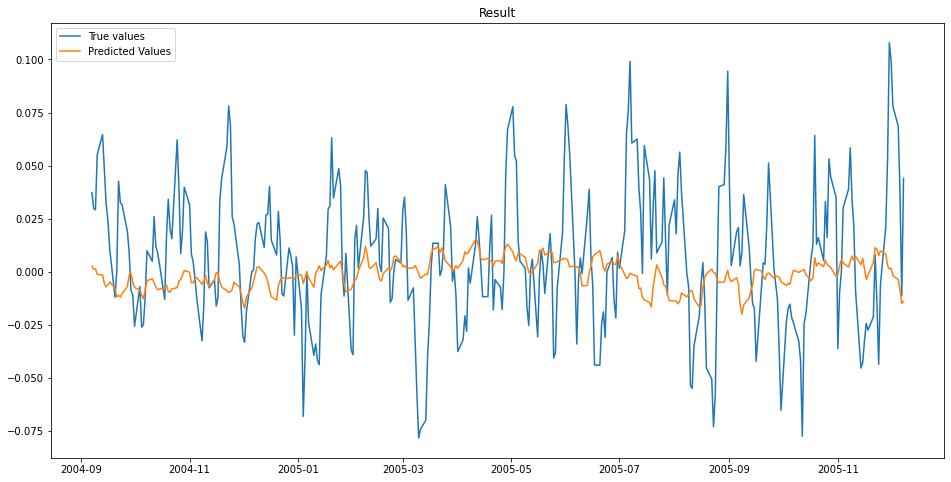


MSE: 0.0011911893434734299

Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 13.8117
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 43 started. Searching for the next optimal point.

learning rate: 0.0008590854739832409
num_input_nodes: 5
dropout: 0.09192121071049746
sequence_length : 100
batch_size: 94



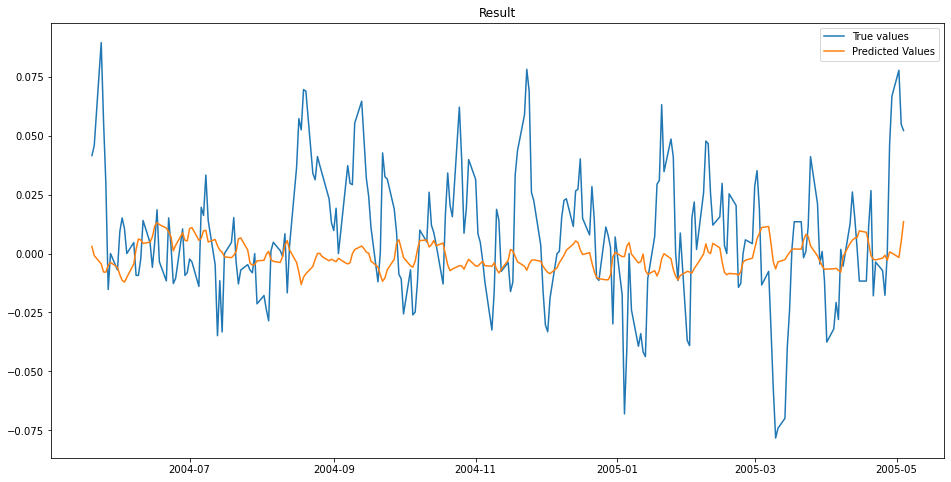


MSE: 0.0008805727772297541

Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 10.6708
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 44 started. Searching for the next optimal point.

learning rate: 0.00015999394011370437
num_input_nodes: 181
dropout: 0.08604513919744848
sequence_length : 110
batch_size: 34



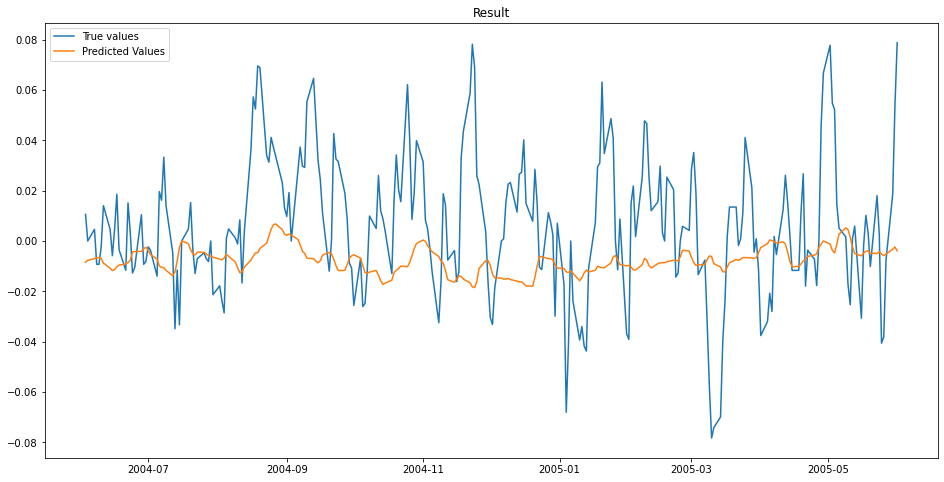


MSE: 0.000949027921961717

Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 29.7859
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 45 started. Searching for the next optimal point.

learning rate: 0.002576050711952346
num_input_nodes: 217
dropout: 0.18008333534734158
sequence_length : 187
batch_size: 33



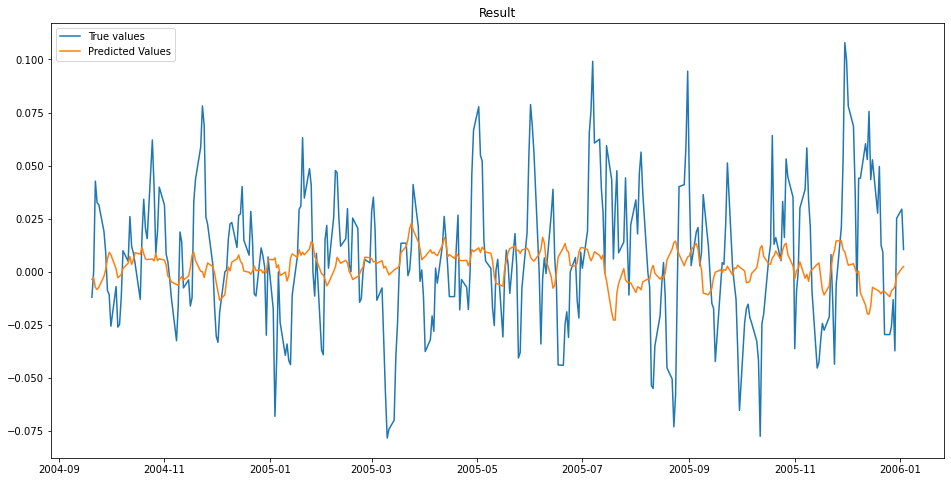


MSE: 0.001159970906157894

Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 49.5515
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 46 started. Searching for the next optimal point.

learning rate: 0.0036879818841733195
num_input_nodes: 88
dropout: 0.24555595662566815
sequence_length : 165
batch_size: 41



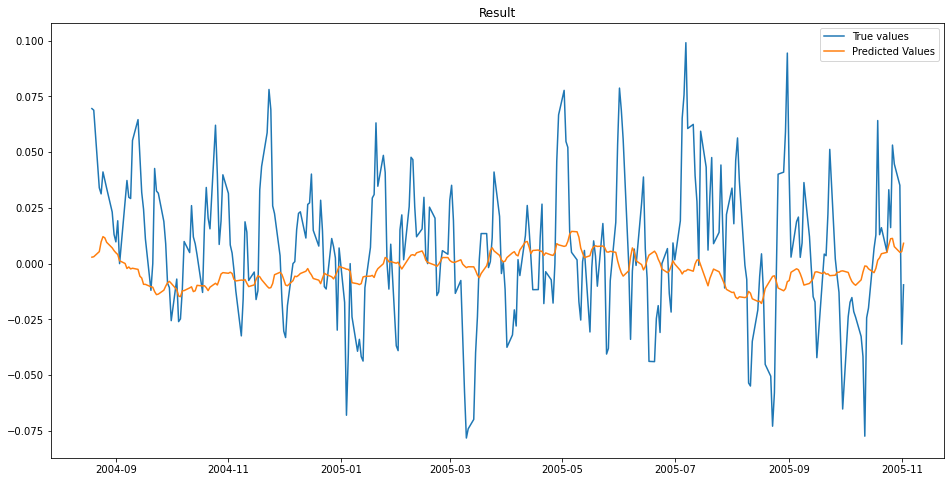


MSE: 0.0011254605447442074

Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 16.2898
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 47 started. Searching for the next optimal point.

learning rate: 0.00011635407776633327
num_input_nodes: 92
dropout: 0.19701404602314318
sequence_length : 157
batch_size: 26



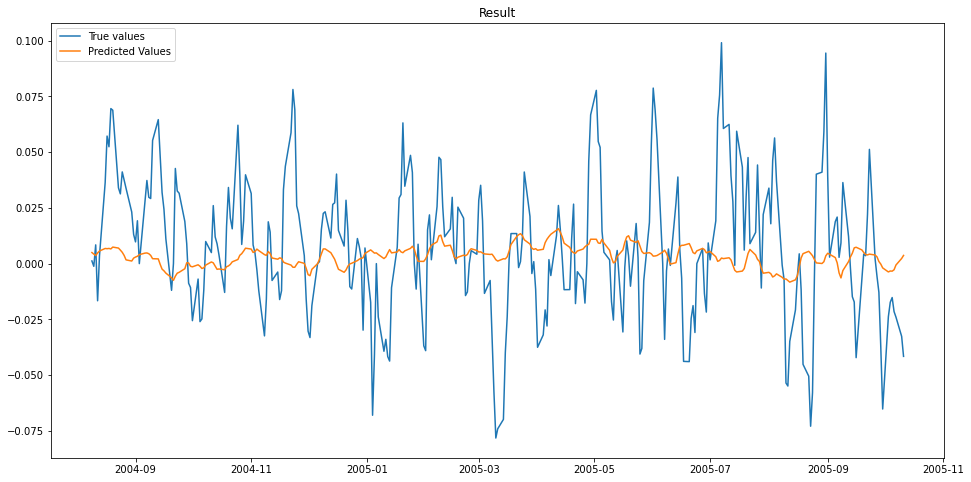


MSE: 0.0010108517619986728

Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 20.8049
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 48 started. Searching for the next optimal point.

learning rate: 0.00098393071892428
num_input_nodes: 216
dropout: 0.0919402180489166
sequence_length : 168
batch_size: 52



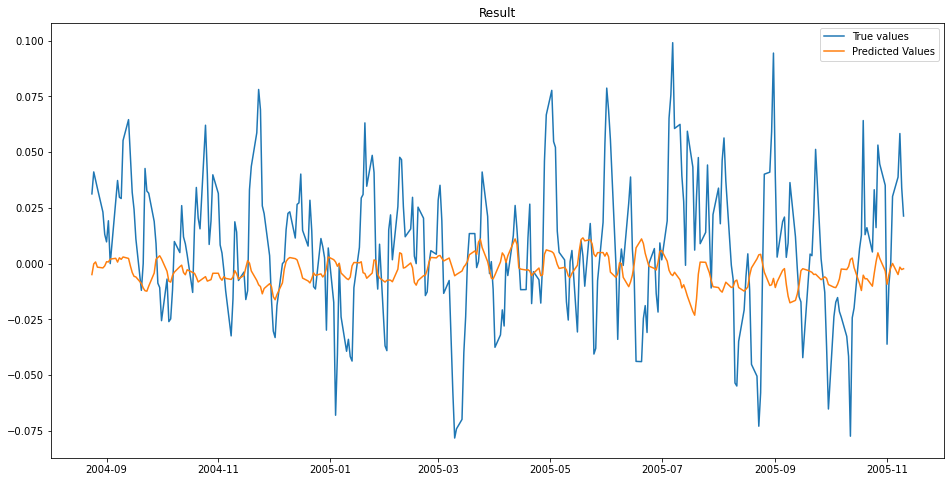


MSE: 0.0011370051994384755

Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 23.4607
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 49 started. Searching for the next optimal point.

learning rate: 0.007319760990864041
num_input_nodes: 256
dropout: 0.25
sequence_length : 100
batch_size: 1



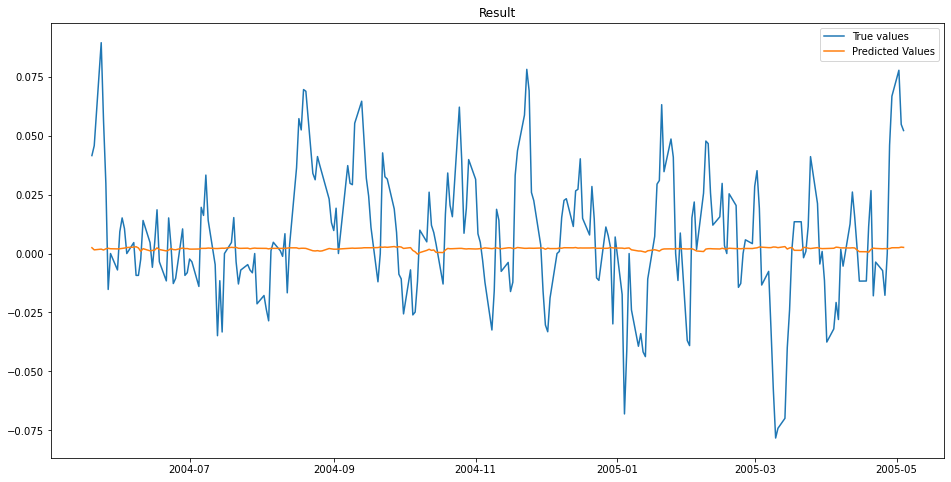


MSE: 0.0007951004191564367

Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 360.1145
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 50 started. Searching for the next optimal point.

learning rate: 0.0015196648522700794
num_input_nodes: 144
dropout: 0.12923914683506915
sequence_length : 107
batch_size: 181



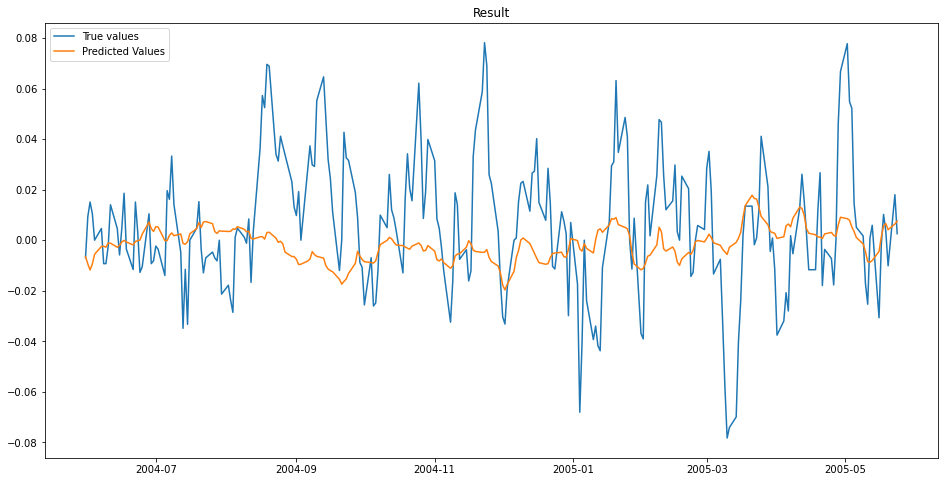


MSE: 0.0007752721700071288

Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 11.3850
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 51 started. Searching for the next optimal point.

learning rate: 0.00035696221331054826
num_input_nodes: 60
dropout: 0.15871059674378532
sequence_length : 152
batch_size: 205



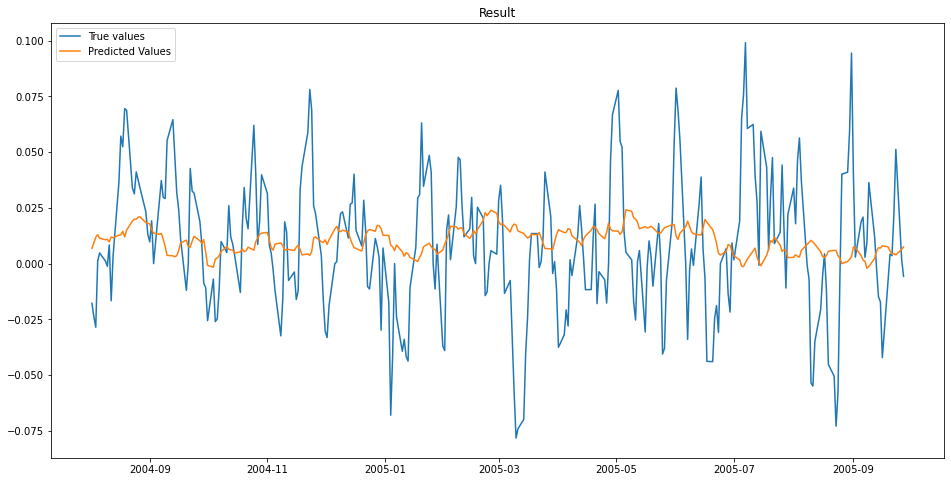


MSE: 0.0010416896897209912

Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 9.9208
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 52 started. Searching for the next optimal point.

learning rate: 0.0001188409223381412
num_input_nodes: 177
dropout: 0.21891156143998414
sequence_length : 168
batch_size: 175



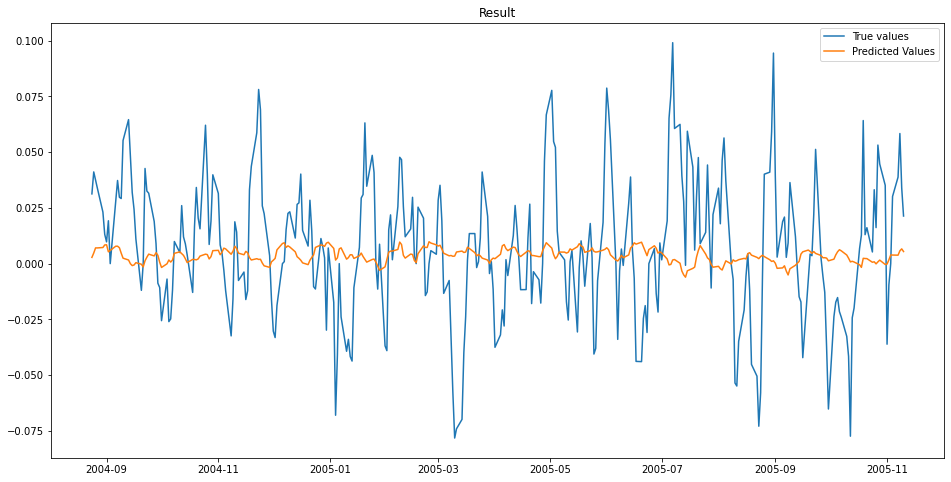


MSE: 0.0010192166539212796

Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 16.2130
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 53 started. Searching for the next optimal point.

learning rate: 0.0033298625298422277
num_input_nodes: 48
dropout: 0.19978580796758103
sequence_length : 124
batch_size: 174



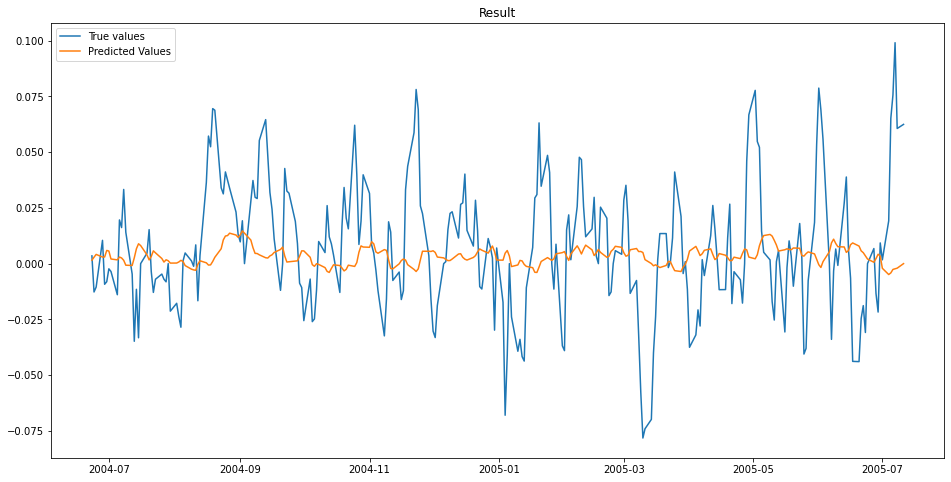


MSE: 0.0009273750222817296

Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 9.4932
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 54 started. Searching for the next optimal point.

learning rate: 0.00036027060747977226
num_input_nodes: 102
dropout: 0.04395199891507324
sequence_length : 157
batch_size: 103



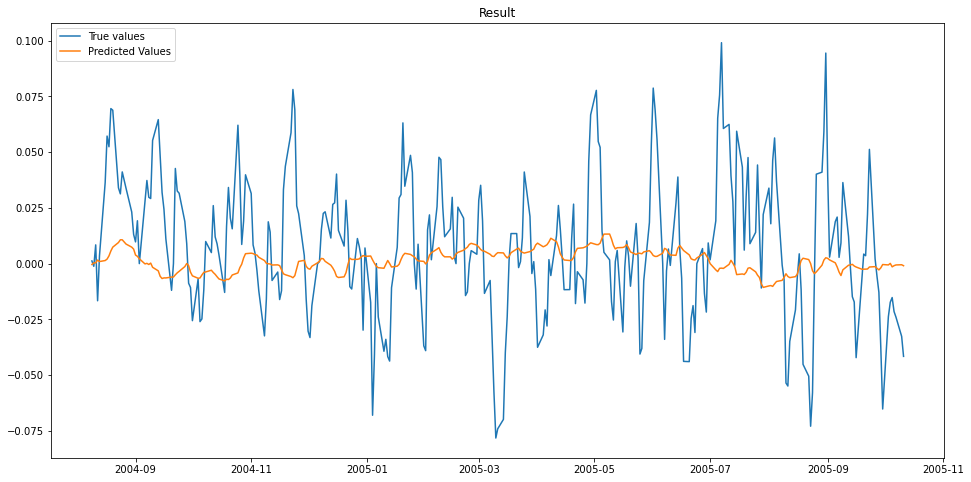


MSE: 0.001066954950181709

Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 14.7791
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 55 started. Searching for the next optimal point.

learning rate: 0.0007041754428186566
num_input_nodes: 24
dropout: 0.1808445203832612
sequence_length : 193
batch_size: 13



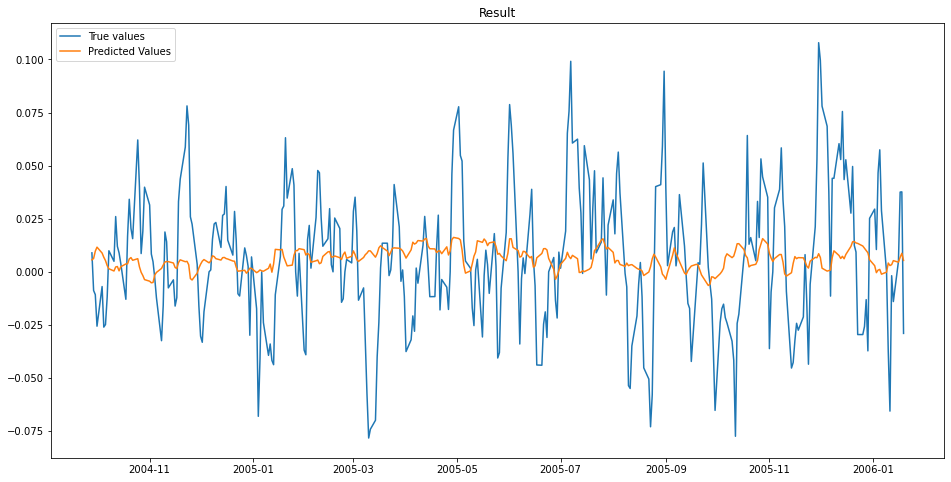


MSE: 0.0011042798309617663

Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 31.2565
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 56 started. Searching for the next optimal point.

learning rate: 0.009919908572416309
num_input_nodes: 75
dropout: 0.06993407026048219
sequence_length : 116
batch_size: 224



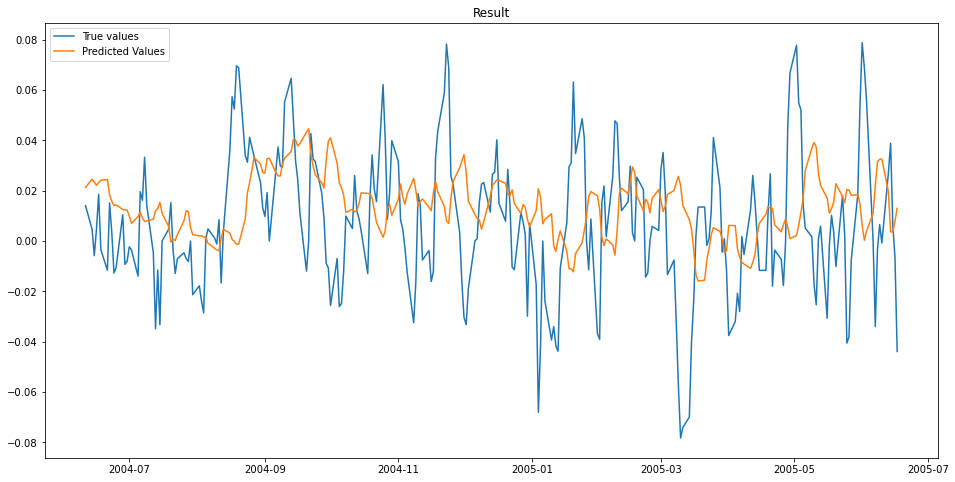


MSE: 0.0010239788689684734

Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 10.0044
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 57 started. Searching for the next optimal point.

learning rate: 0.00016524946559049166
num_input_nodes: 256
dropout: 0.18386715811638285
sequence_length : 100
batch_size: 68



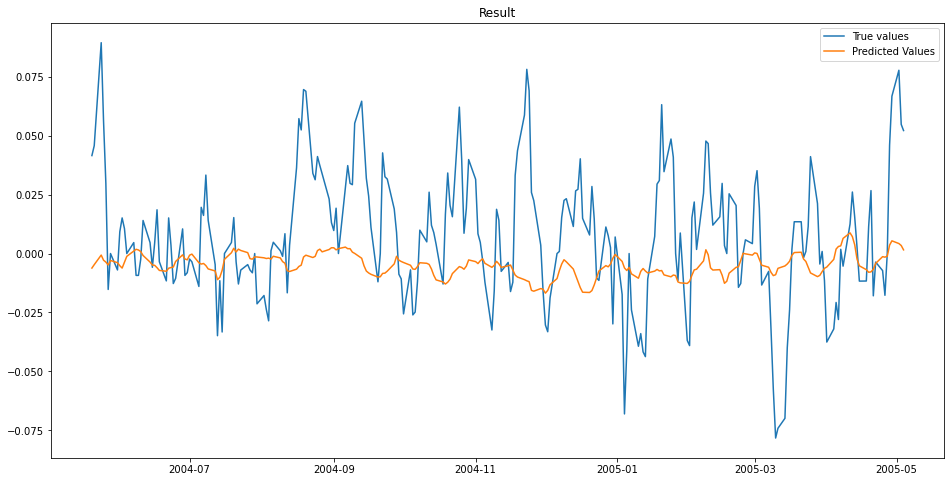


MSE: 0.0009065823301365968

Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 16.2332
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 58 started. Searching for the next optimal point.

learning rate: 0.0009519885287777707
num_input_nodes: 132
dropout: 0.029560473583090864
sequence_length : 146
batch_size: 176



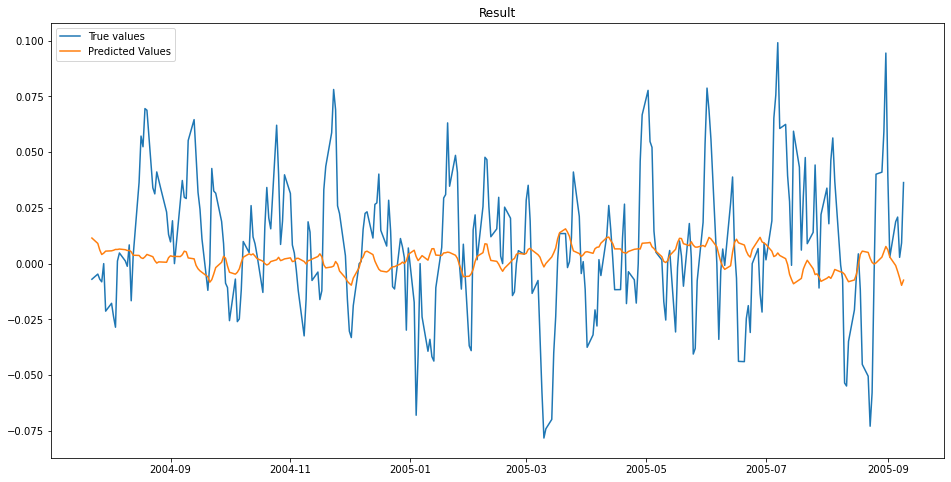


MSE: 0.0010154876623735133

Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 11.6767
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 59 started. Searching for the next optimal point.

learning rate: 0.00023511338162735855
num_input_nodes: 256
dropout: 0.18847151637274845
sequence_length : 100
batch_size: 1



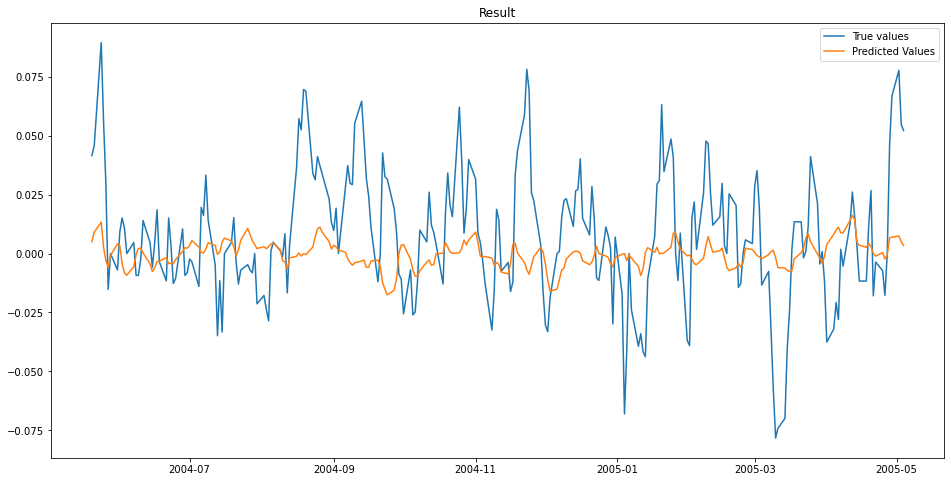


MSE: 0.0008098514859487037

Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 256.0389
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 60 started. Searching for the next optimal point.

learning rate: 0.00010180274711078338
num_input_nodes: 163
dropout: 0.07920302891584906
sequence_length : 176
batch_size: 158



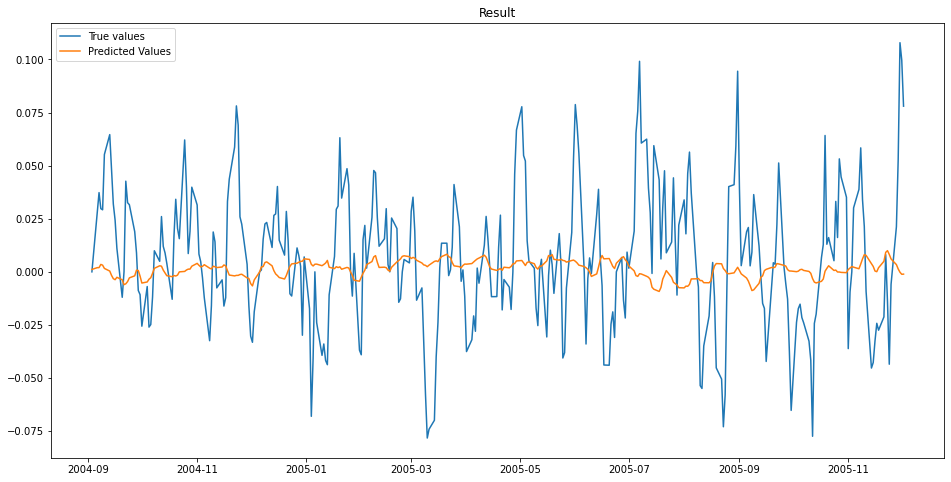


MSE: 0.0011418781090956189

Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 21.6017
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 61 started. Searching for the next optimal point.

learning rate: 0.004601649422606682
num_input_nodes: 85
dropout: 0.015120516756848643
sequence_length : 148
batch_size: 188



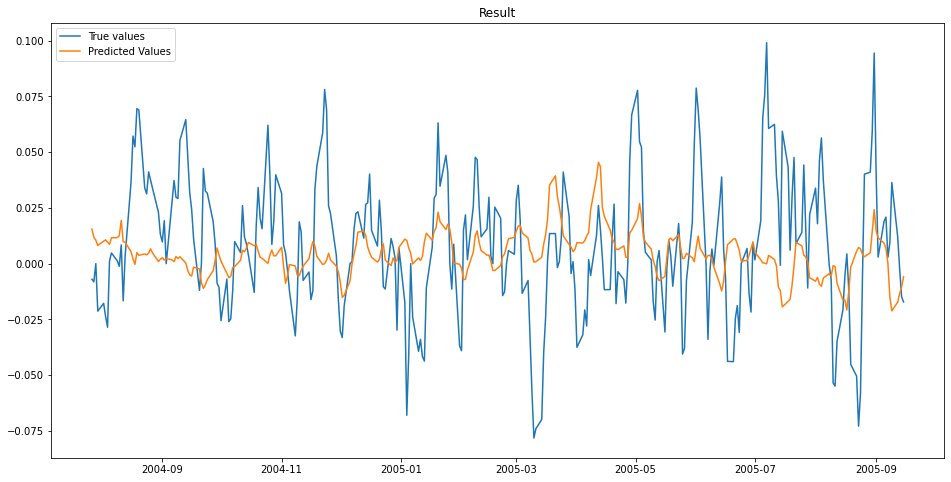


MSE: 0.0010360634709657747

Iteration No: 61 ended. Search finished for the next optimal point.
Time taken: 15.9836
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 62 started. Searching for the next optimal point.

learning rate: 0.003778761170677325
num_input_nodes: 207
dropout: 0.17932400172786384
sequence_length : 169
batch_size: 166



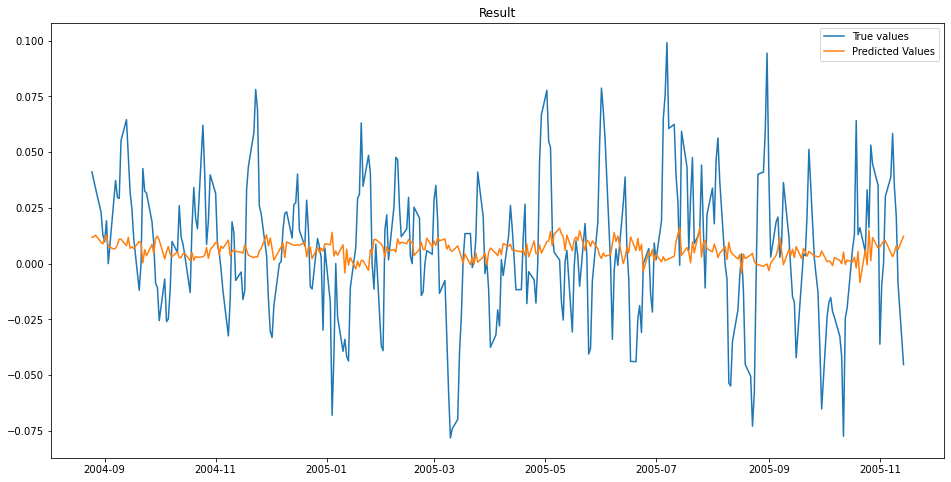


MSE: 0.0010329144303152392

Iteration No: 62 ended. Search finished for the next optimal point.
Time taken: 20.1448
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 63 started. Searching for the next optimal point.

learning rate: 0.0061651785570915555
num_input_nodes: 256
dropout: 0.1804113614600372
sequence_length : 100
batch_size: 182



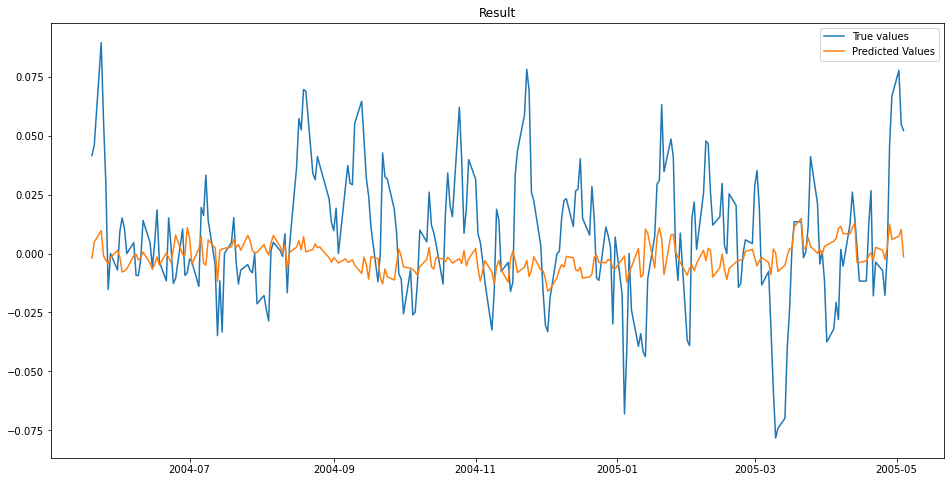


MSE: 0.00083376197388765

Iteration No: 63 ended. Search finished for the next optimal point.
Time taken: 13.5974
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 64 started. Searching for the next optimal point.

learning rate: 0.005093286647385309
num_input_nodes: 5
dropout: 0.14967734152682677
sequence_length : 100
batch_size: 22



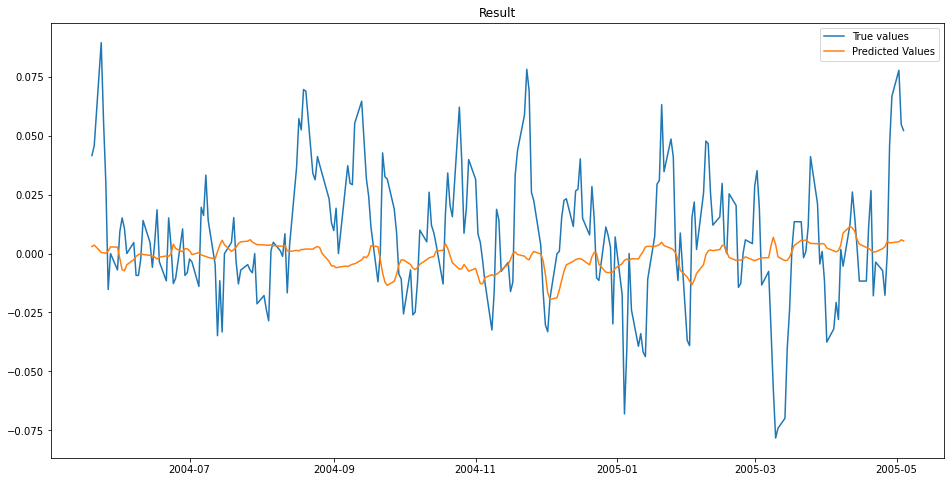


MSE: 0.0008518421292292344

Iteration No: 64 ended. Search finished for the next optimal point.
Time taken: 22.3739
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 65 started. Searching for the next optimal point.

learning rate: 0.003509587766039789
num_input_nodes: 256
dropout: 0.22443787745236607
sequence_length : 100
batch_size: 38



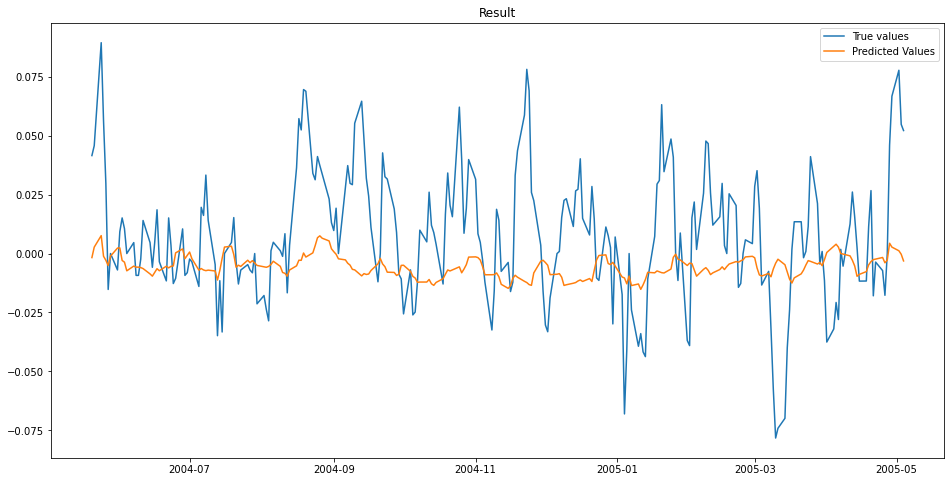


MSE: 0.0009210660032681361

Iteration No: 65 ended. Search finished for the next optimal point.
Time taken: 19.3221
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 66 started. Searching for the next optimal point.

learning rate: 0.0024481035257698422
num_input_nodes: 102
dropout: 0.08581756268412698
sequence_length : 200
batch_size: 1



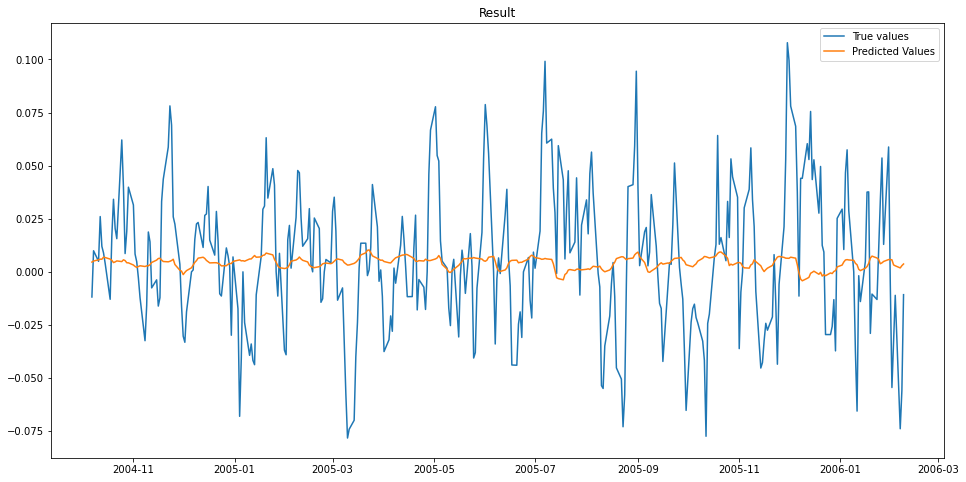


MSE: 0.0011409961546389297

Iteration No: 66 ended. Search finished for the next optimal point.
Time taken: 287.9576
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 67 started. Searching for the next optimal point.

learning rate: 0.00014476706831299192
num_input_nodes: 203
dropout: 0.14726485363284803
sequence_length : 200
batch_size: 166



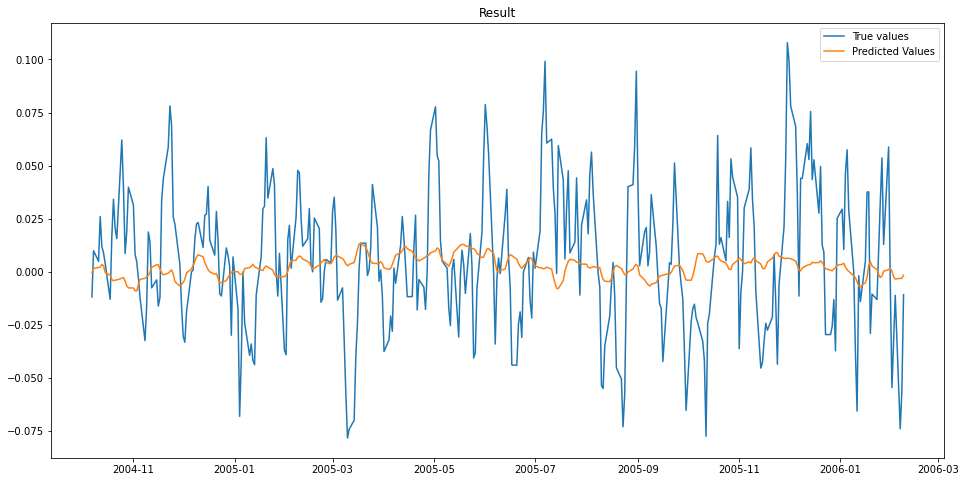


MSE: 0.0011488015924233578

Iteration No: 67 ended. Search finished for the next optimal point.
Time taken: 18.9882
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 68 started. Searching for the next optimal point.

learning rate: 0.0001703614412866861
num_input_nodes: 254
dropout: 0.19476335722100108
sequence_length : 100
batch_size: 245



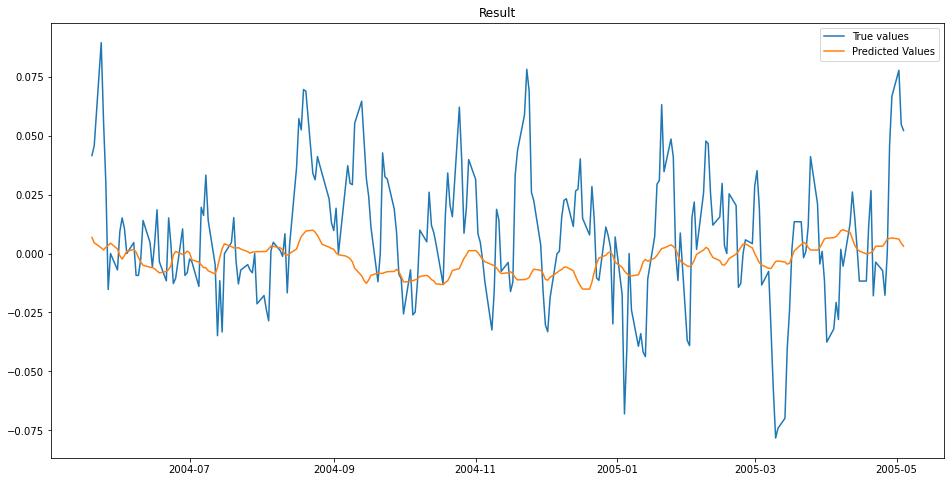


MSE: 0.0008579661656670288

Iteration No: 68 ended. Search finished for the next optimal point.
Time taken: 13.2206
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 69 started. Searching for the next optimal point.

learning rate: 0.00022898042712449123
num_input_nodes: 142
dropout: 0.017850679904295817
sequence_length : 167
batch_size: 36



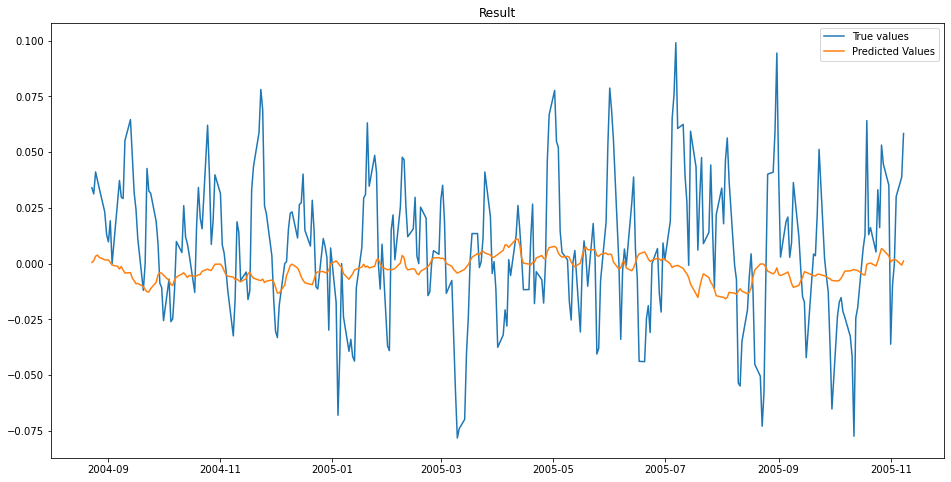


MSE: 0.0010930126137652456

Iteration No: 69 ended. Search finished for the next optimal point.
Time taken: 31.6234
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 70 started. Searching for the next optimal point.

learning rate: 0.00415313472997089
num_input_nodes: 163
dropout: 0.011486325079716865
sequence_length : 174
batch_size: 106



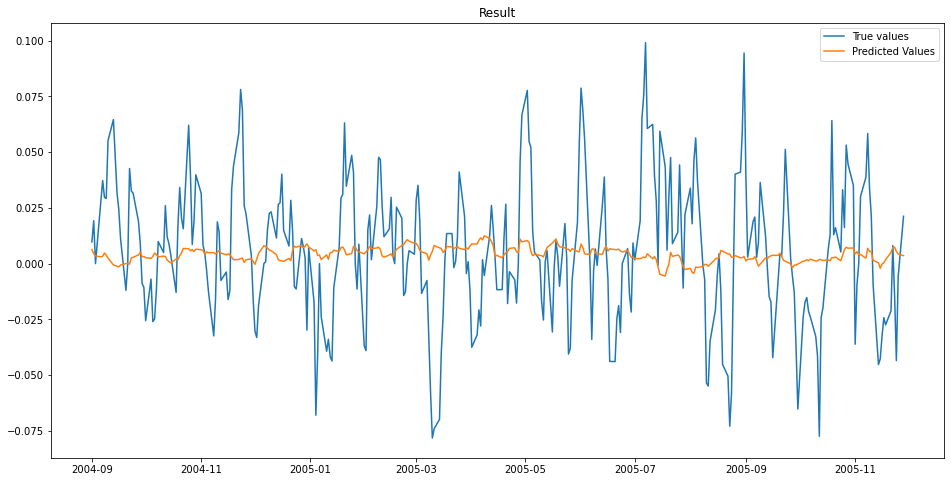


MSE: 0.0010097519796375299

Iteration No: 70 ended. Search finished for the next optimal point.
Time taken: 20.0700
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 71 started. Searching for the next optimal point.

learning rate: 0.002883803673110503
num_input_nodes: 16
dropout: 0.25
sequence_length : 100
batch_size: 214



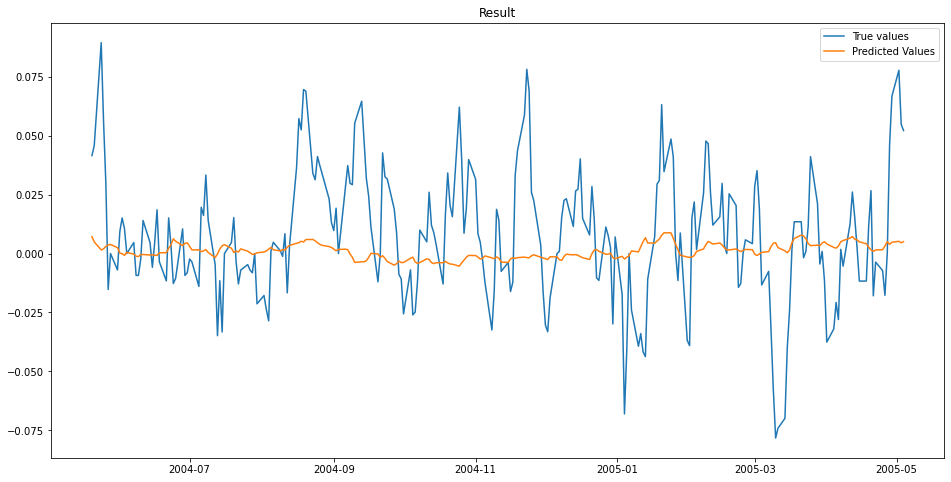


MSE: 0.0008039690377362048

Iteration No: 71 ended. Search finished for the next optimal point.
Time taken: 8.8967
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 72 started. Searching for the next optimal point.

learning rate: 0.001934714882000995
num_input_nodes: 14
dropout: 0.1496472888041074
sequence_length : 176
batch_size: 40



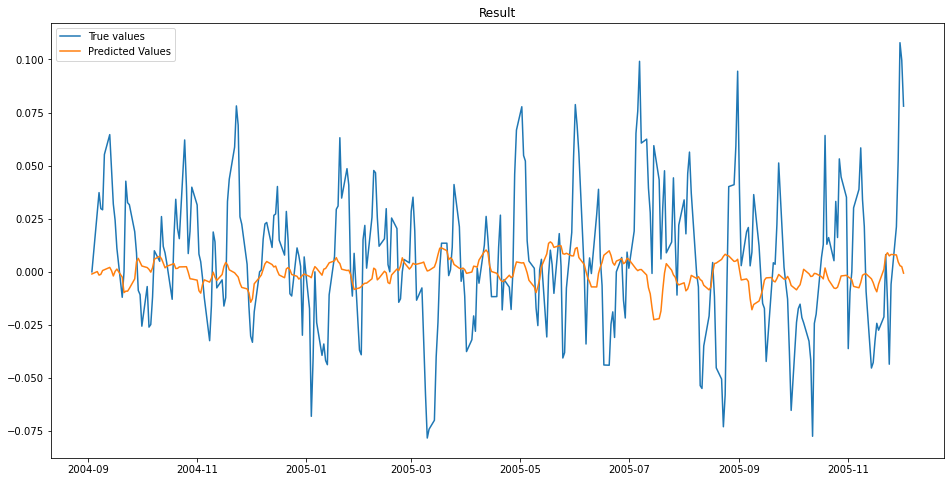


MSE: 0.0011472394707859508

Iteration No: 72 ended. Search finished for the next optimal point.
Time taken: 19.5581
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 73 started. Searching for the next optimal point.

learning rate: 0.0001960116571995673
num_input_nodes: 238
dropout: 0.016410823138326067
sequence_length : 128
batch_size: 216



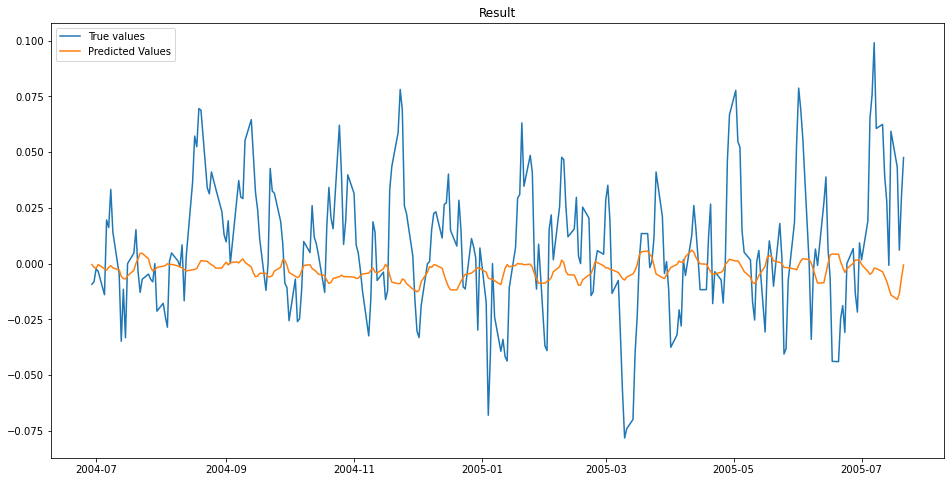


MSE: 0.000995614576892546

Iteration No: 73 ended. Search finished for the next optimal point.
Time taken: 14.8189
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 74 started. Searching for the next optimal point.

learning rate: 0.0016564469777783752
num_input_nodes: 168
dropout: 0.10476539484311784
sequence_length : 179
batch_size: 71



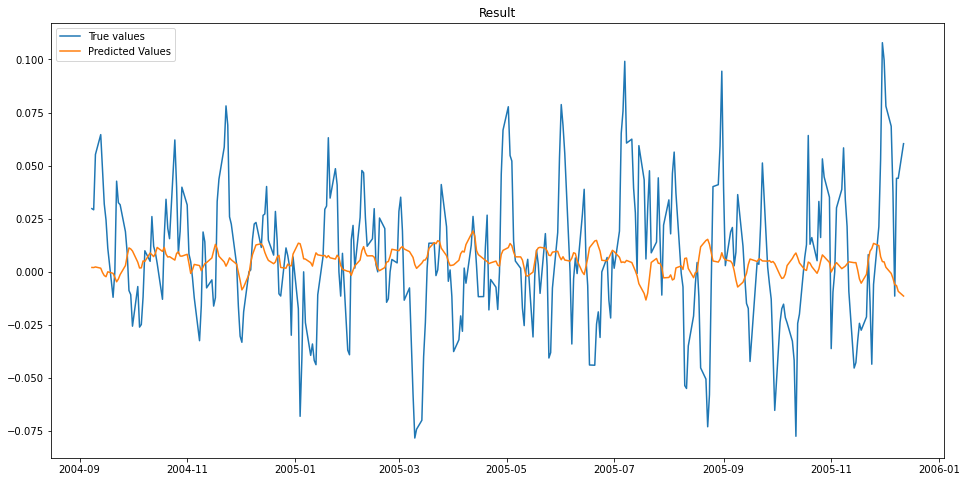


MSE: 0.0011479689112270264

Iteration No: 74 ended. Search finished for the next optimal point.
Time taken: 22.4496
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 75 started. Searching for the next optimal point.

learning rate: 0.00020458807202446572
num_input_nodes: 88
dropout: 0.2289375289856191
sequence_length : 199
batch_size: 222



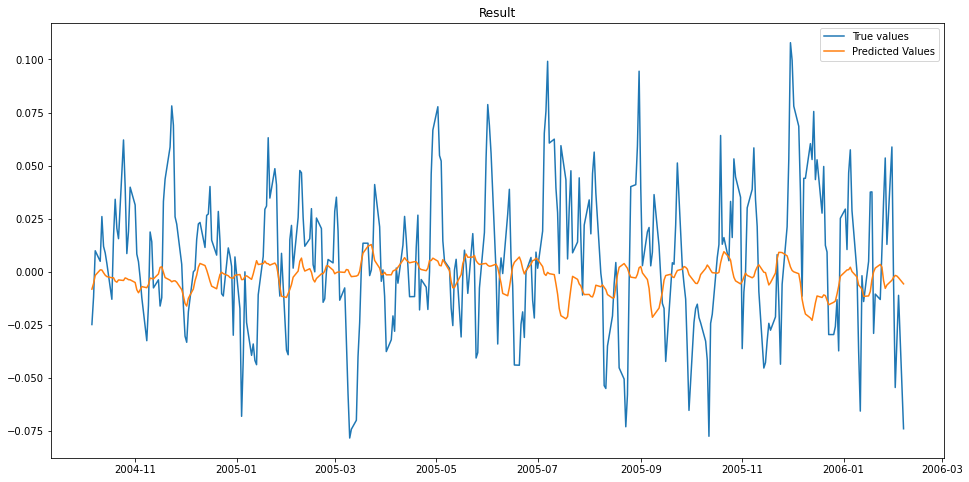


MSE: 0.001271378823205587

Iteration No: 75 ended. Search finished for the next optimal point.
Time taken: 11.8961
Function value obtained: 0.0013
Current minimum: 0.0008
Iteration No: 76 started. Searching for the next optimal point.

learning rate: 0.00936354814193516
num_input_nodes: 58
dropout: 0.018650182734457125
sequence_length : 177
batch_size: 155



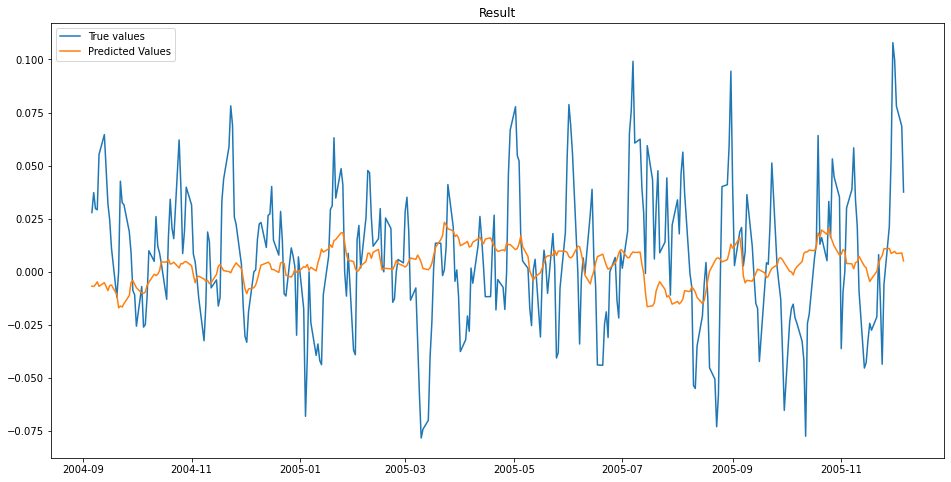


MSE: 0.0011248472560293626

Iteration No: 76 ended. Search finished for the next optimal point.
Time taken: 13.8134
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 77 started. Searching for the next optimal point.

learning rate: 0.0006277318630327672
num_input_nodes: 170
dropout: 0.17310481009819254
sequence_length : 195
batch_size: 179



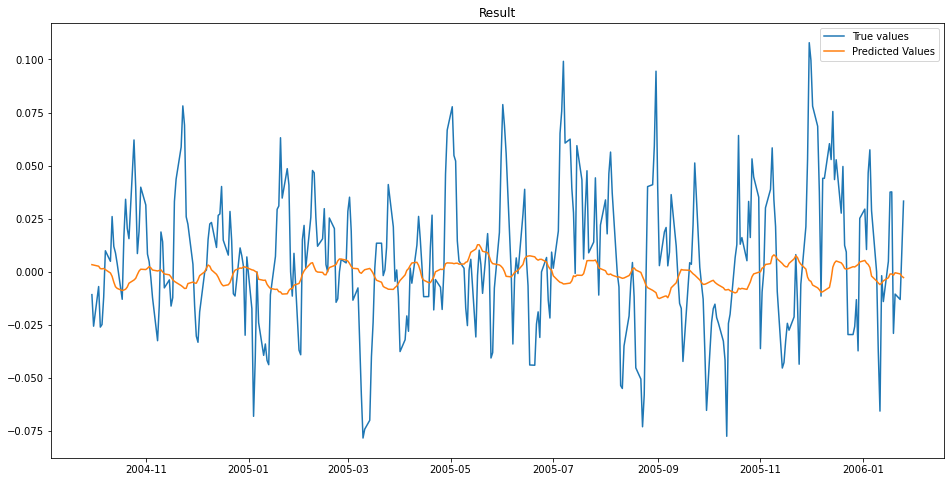


MSE: 0.0012310074703184776

Iteration No: 77 ended. Search finished for the next optimal point.
Time taken: 17.6013
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 78 started. Searching for the next optimal point.

learning rate: 0.0015393462375139775
num_input_nodes: 205
dropout: 0.0
sequence_length : 100
batch_size: 186



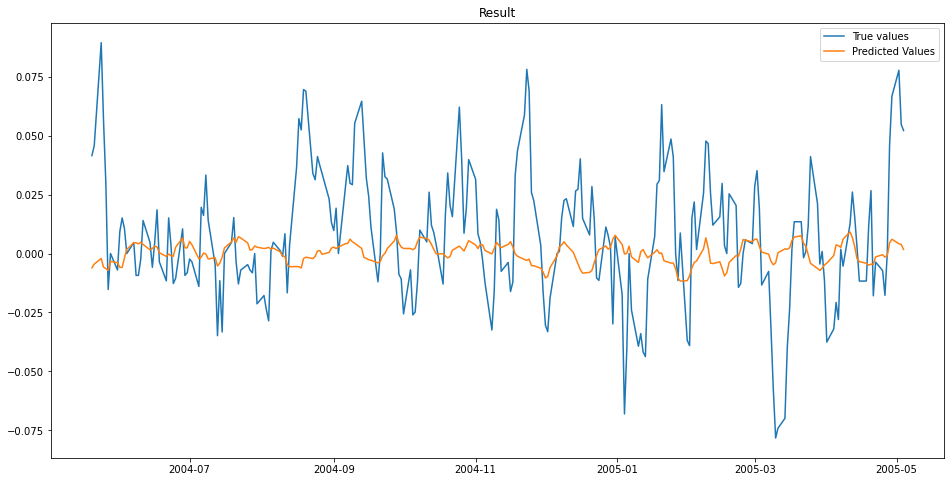


MSE: 0.0008296071718492959

Iteration No: 78 ended. Search finished for the next optimal point.
Time taken: 13.9318
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 79 started. Searching for the next optimal point.

learning rate: 0.0024768316121782804
num_input_nodes: 166
dropout: 0.015770349364863216
sequence_length : 128
batch_size: 83



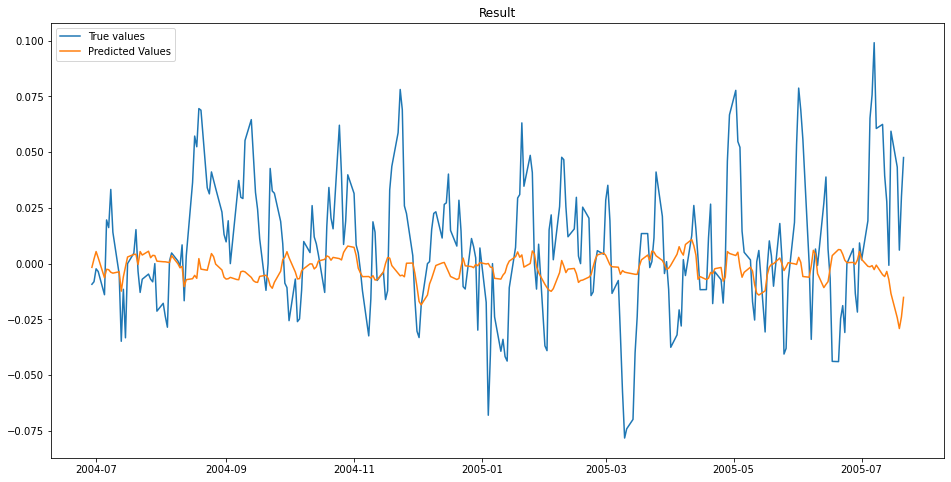


MSE: 0.000996408438258477

Iteration No: 79 ended. Search finished for the next optimal point.
Time taken: 23.7429
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 80 started. Searching for the next optimal point.

learning rate: 0.0011848875333369338
num_input_nodes: 148
dropout: 0.1820547760128416
sequence_length : 186
batch_size: 112



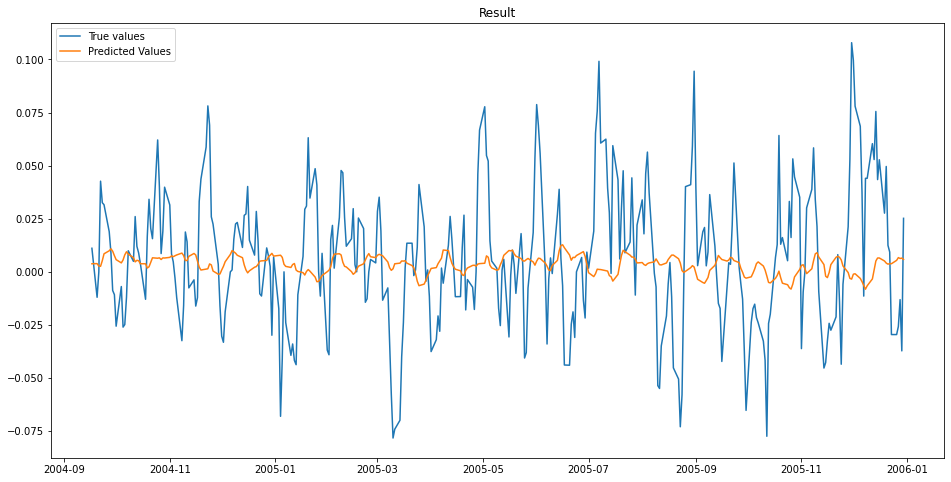


MSE: 0.001162396879756025

Iteration No: 80 ended. Search finished for the next optimal point.
Time taken: 14.8961
Function value obtained: 0.0012
Current minimum: 0.0008
Iteration No: 81 started. Searching for the next optimal point.

learning rate: 0.004494202830436449
num_input_nodes: 24
dropout: 0.25
sequence_length : 100
batch_size: 81



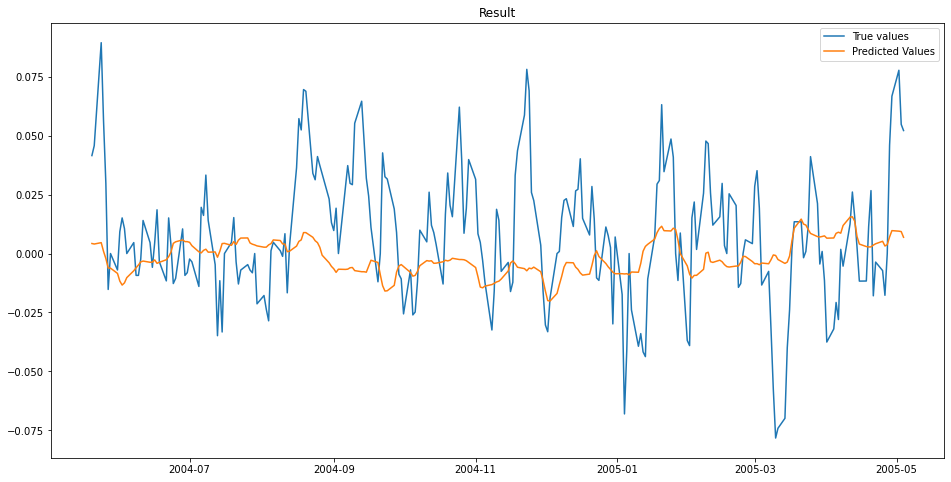


MSE: 0.0008459180273309486

Iteration No: 81 ended. Search finished for the next optimal point.
Time taken: 11.4042
Function value obtained: 0.0008
Current minimum: 0.0008
Iteration No: 82 started. Searching for the next optimal point.

learning rate: 0.002827388517269168
num_input_nodes: 209
dropout: 0.17279149398322147
sequence_length : 117
batch_size: 247



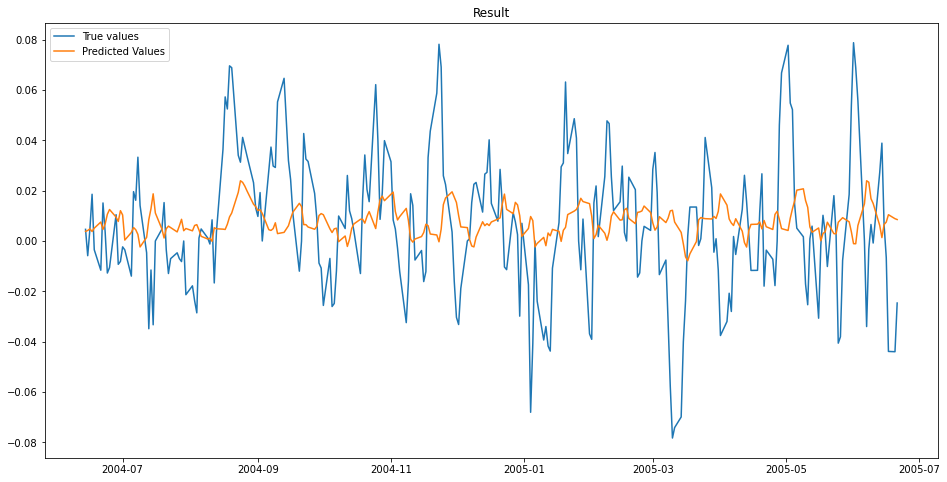


MSE: 0.0008553645828547332

Iteration No: 82 ended. Search finished for the next optimal point.
Time taken: 13.0737
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 83 started. Searching for the next optimal point.

learning rate: 0.0010175461262211167
num_input_nodes: 159
dropout: 0.21268918654950092
sequence_length : 117
batch_size: 96



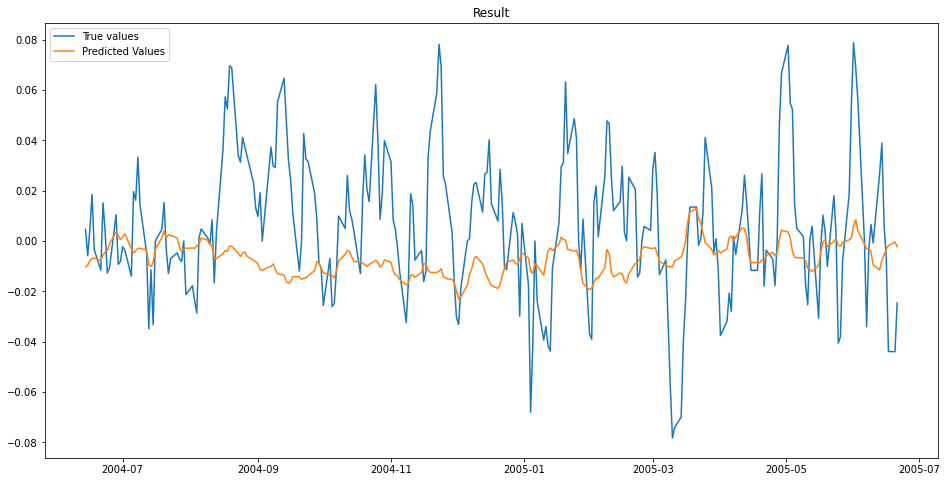


MSE: 0.0009558801331339079

Iteration No: 83 ended. Search finished for the next optimal point.
Time taken: 18.7547
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 84 started. Searching for the next optimal point.

learning rate: 0.0019620658397930023
num_input_nodes: 247
dropout: 0.0796603052293783
sequence_length : 141
batch_size: 82



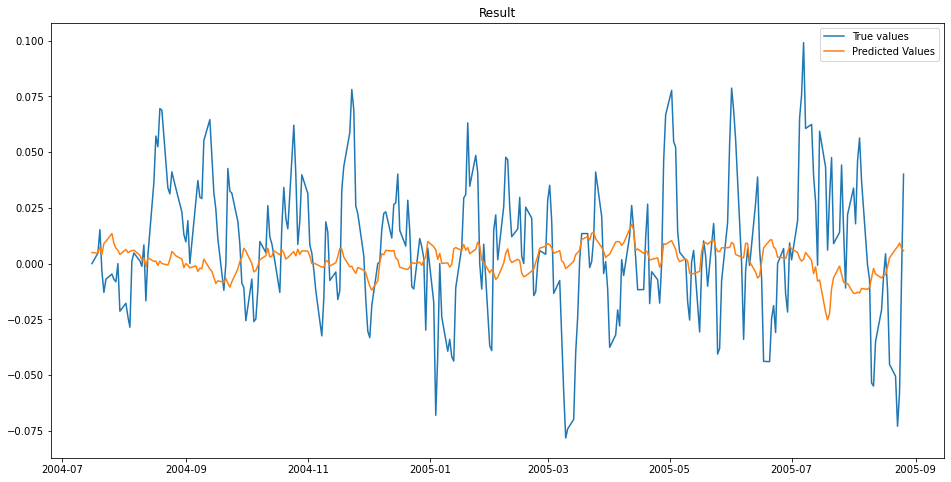


MSE: 0.0010269664357735416

Iteration No: 84 ended. Search finished for the next optimal point.
Time taken: 25.5537
Function value obtained: 0.0010
Current minimum: 0.0008
Iteration No: 85 started. Searching for the next optimal point.

learning rate: 0.008043191210903316
num_input_nodes: 42
dropout: 0.22844898929603968
sequence_length : 113
batch_size: 68



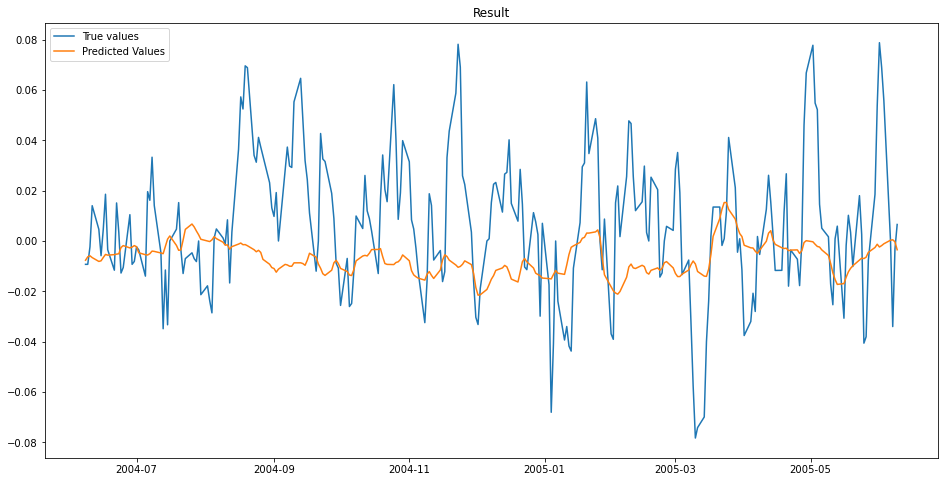


MSE: 0.0009258630714421143

Iteration No: 85 ended. Search finished for the next optimal point.
Time taken: 15.1772
Function value obtained: 0.0009
Current minimum: 0.0008
Iteration No: 86 started. Searching for the next optimal point.

learning rate: 0.0038009778724640993
num_input_nodes: 232
dropout: 0.12491961823757344
sequence_length : 136
batch_size: 71



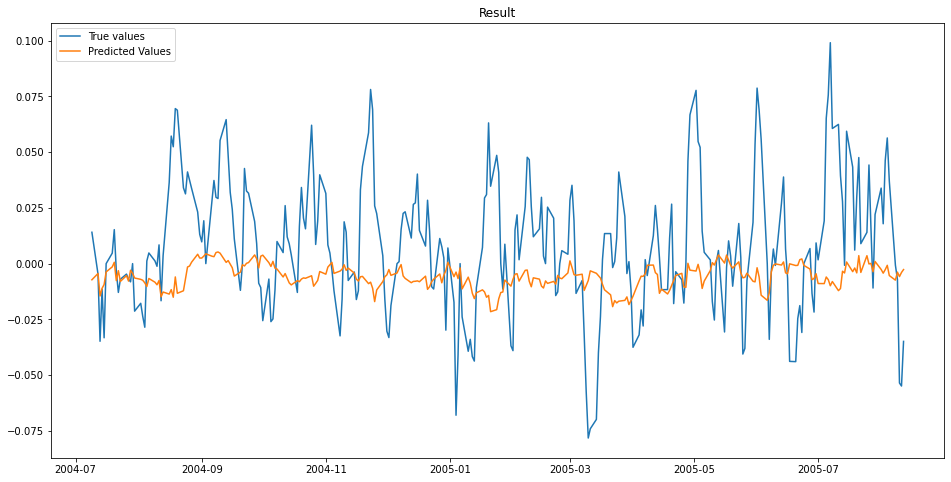


MSE: 0.0011143536711843407

Iteration No: 86 ended. Search finished for the next optimal point.
Time taken: 17.6413
Function value obtained: 0.0011
Current minimum: 0.0008
Iteration No: 87 started. Searching for the next optimal point.

learning rate: 0.005333059284877444
num_input_nodes: 28
dropout: 0.10729957267690465
sequence_length : 105
batch_size: 246



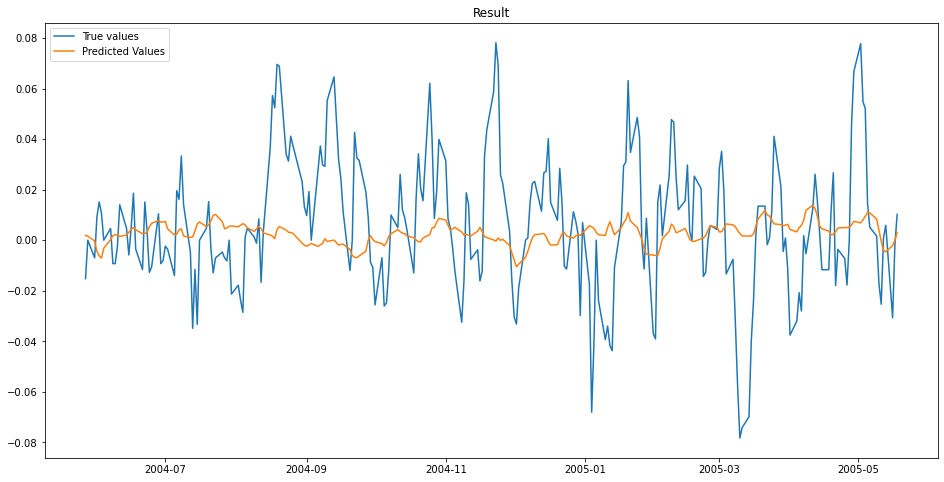


MSE: 0.0007377656604438391

Iteration No: 87 ended. Search finished for the next optimal point.
Time taken: 10.7610
Function value obtained: 0.0007
Current minimum: 0.0007
Iteration No: 88 started. Searching for the next optimal point.

learning rate: 0.0001477443660864128
num_input_nodes: 152
dropout: 0.13384018712408904
sequence_length : 181
batch_size: 59



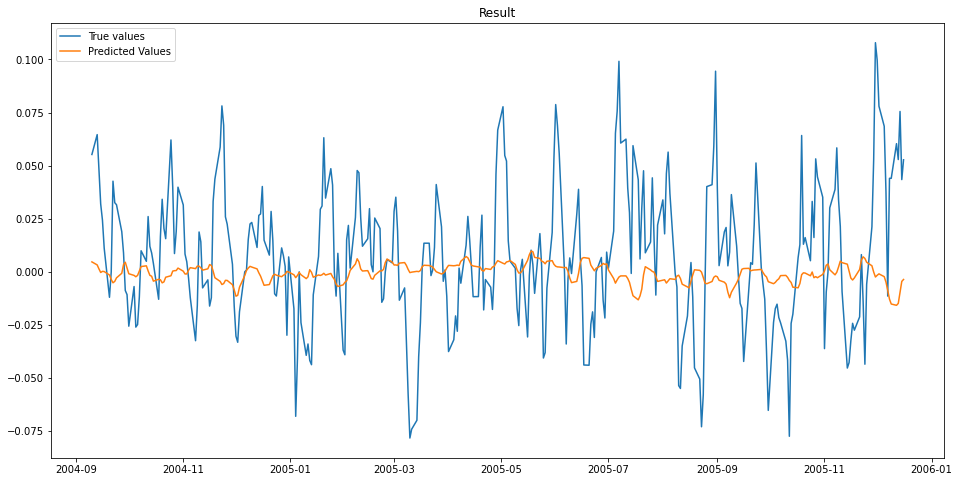


MSE: 0.0012330509990104857

Iteration No: 88 ended. Search finished for the next optimal point.
Time taken: 18.3914
Function value obtained: 0.0012
Current minimum: 0.0007
Iteration No: 89 started. Searching for the next optimal point.

learning rate: 0.00012445264279754227
num_input_nodes: 250
dropout: 0.09612500314239805
sequence_length : 100
batch_size: 250



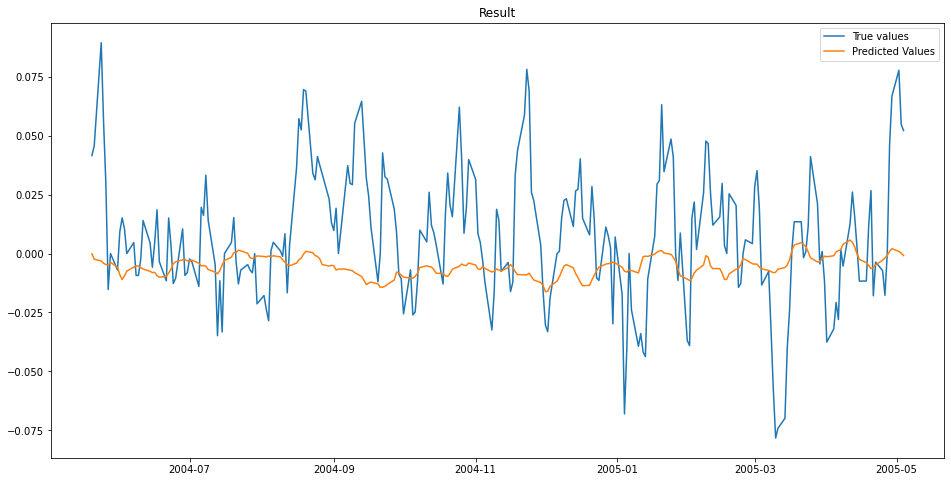


MSE: 0.0009239536623509711

Iteration No: 89 ended. Search finished for the next optimal point.
Time taken: 12.9222
Function value obtained: 0.0009
Current minimum: 0.0007
Iteration No: 90 started. Searching for the next optimal point.

learning rate: 0.003733473307491649
num_input_nodes: 106
dropout: 0.1397351285801814
sequence_length : 131
batch_size: 27



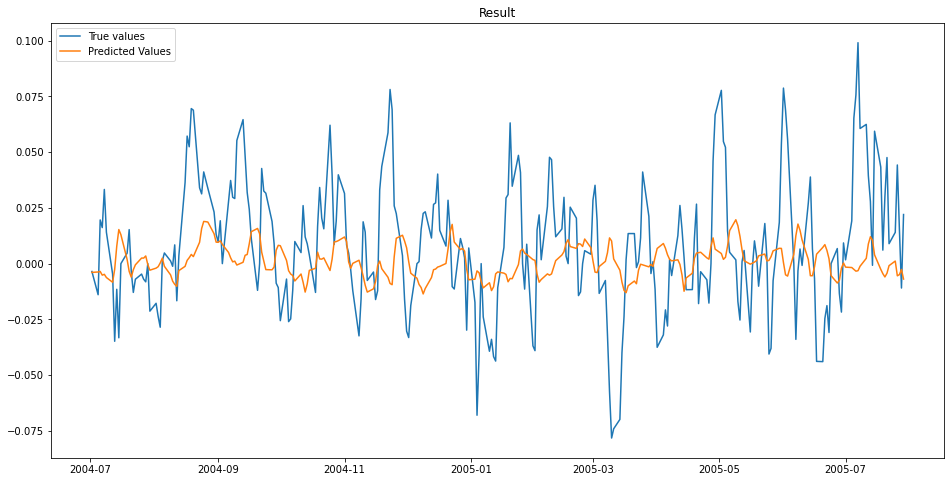


MSE: 0.000984782879680659

Iteration No: 90 ended. Search finished for the next optimal point.
Time taken: 32.9361
Function value obtained: 0.0010
Current minimum: 0.0007
Iteration No: 91 started. Searching for the next optimal point.

learning rate: 0.004189497072820543
num_input_nodes: 205
dropout: 0.05282949445473359
sequence_length : 100
batch_size: 130



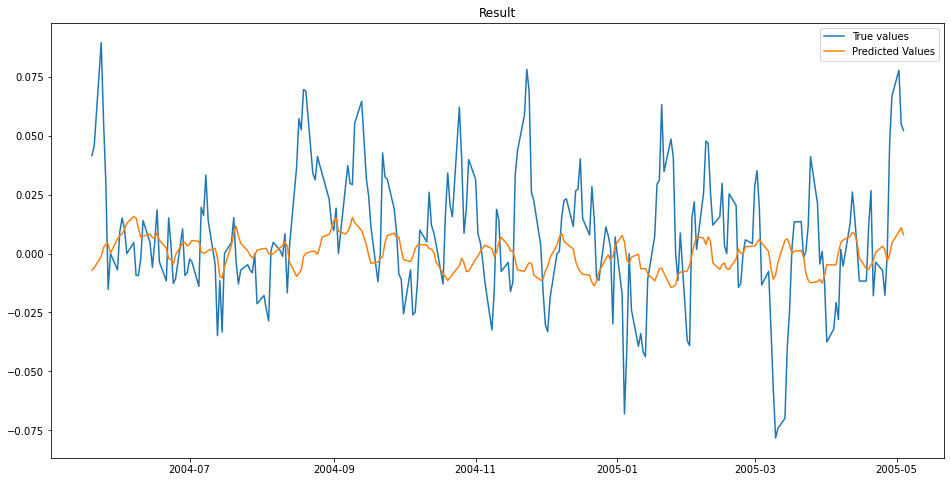


MSE: 0.0008472969464623931

Iteration No: 91 ended. Search finished for the next optimal point.
Time taken: 14.2691
Function value obtained: 0.0008
Current minimum: 0.0007
Iteration No: 92 started. Searching for the next optimal point.

learning rate: 0.00014820752032875827
num_input_nodes: 231
dropout: 0.25
sequence_length : 100
batch_size: 183



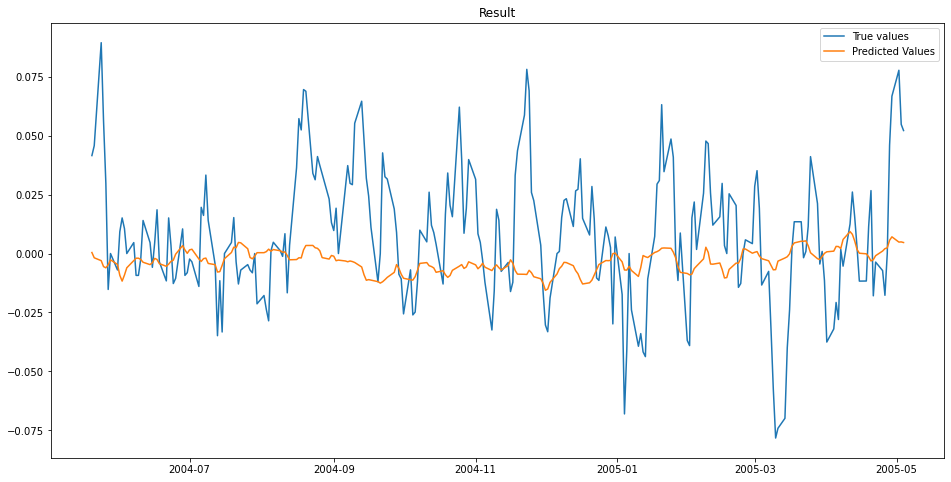


MSE: 0.0008762548467422979

Iteration No: 92 ended. Search finished for the next optimal point.
Time taken: 14.3043
Function value obtained: 0.0009
Current minimum: 0.0007
Iteration No: 93 started. Searching for the next optimal point.

learning rate: 0.001454010611221609
num_input_nodes: 52
dropout: 0.09308903147973126
sequence_length : 116
batch_size: 182



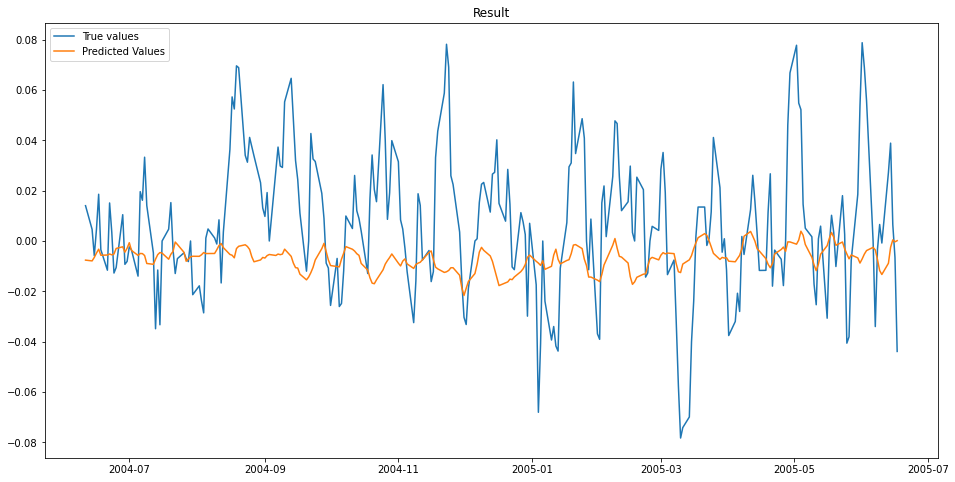


MSE: 0.0009418899797352924

Iteration No: 93 ended. Search finished for the next optimal point.
Time taken: 10.3917
Function value obtained: 0.0009
Current minimum: 0.0007
Iteration No: 94 started. Searching for the next optimal point.

learning rate: 0.00013922483491784666
num_input_nodes: 57
dropout: 0.00809265959299685
sequence_length : 154
batch_size: 51



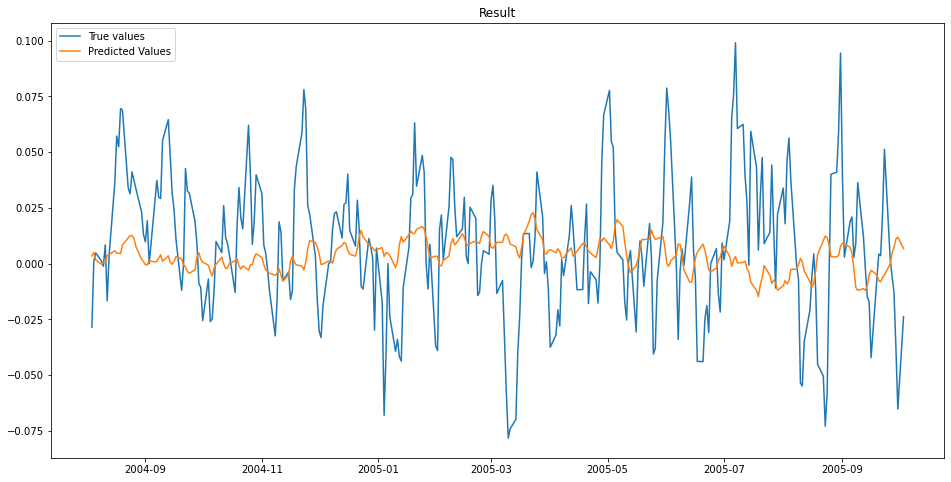


MSE: 0.0010834009747045

Iteration No: 94 ended. Search finished for the next optimal point.
Time taken: 18.4532
Function value obtained: 0.0011
Current minimum: 0.0007
Iteration No: 95 started. Searching for the next optimal point.

learning rate: 0.0006241138288719149
num_input_nodes: 33
dropout: 0.25
sequence_length : 100
batch_size: 250



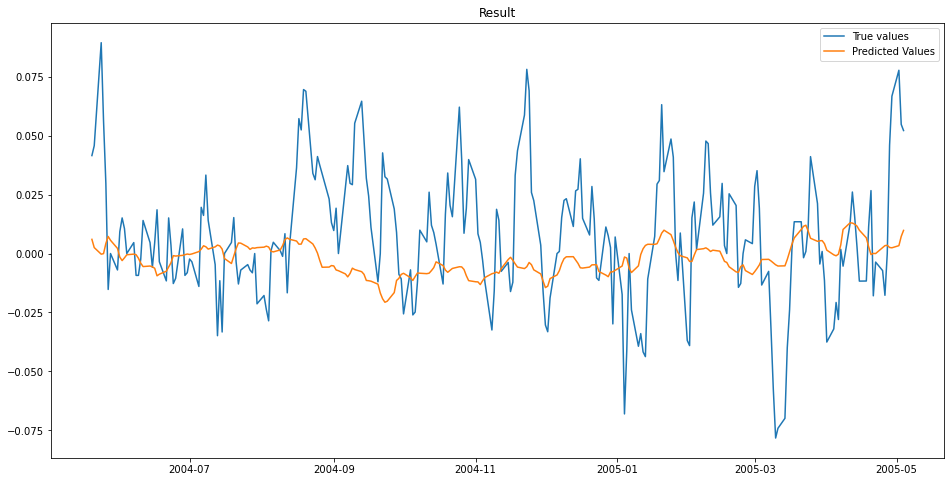


MSE: 0.0008810141311190439

Iteration No: 95 ended. Search finished for the next optimal point.
Time taken: 9.5258
Function value obtained: 0.0009
Current minimum: 0.0007
Iteration No: 96 started. Searching for the next optimal point.

learning rate: 0.008598385926326632
num_input_nodes: 19
dropout: 0.10753256704094956
sequence_length : 100
batch_size: 62



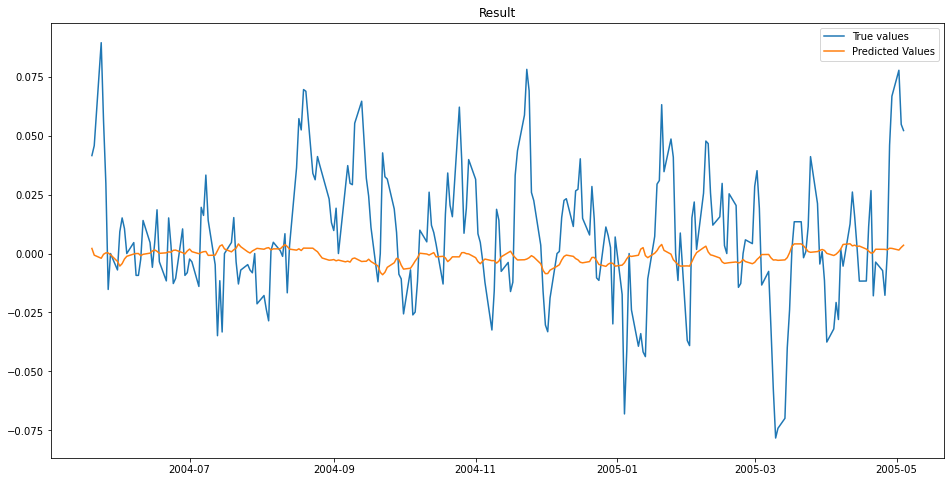


MSE: 0.0008299364978726084

Iteration No: 96 ended. Search finished for the next optimal point.
Time taken: 12.9865
Function value obtained: 0.0008
Current minimum: 0.0007
Iteration No: 97 started. Searching for the next optimal point.

learning rate: 0.0002890880806223456
num_input_nodes: 237
dropout: 0.12307850504510529
sequence_length : 160
batch_size: 232



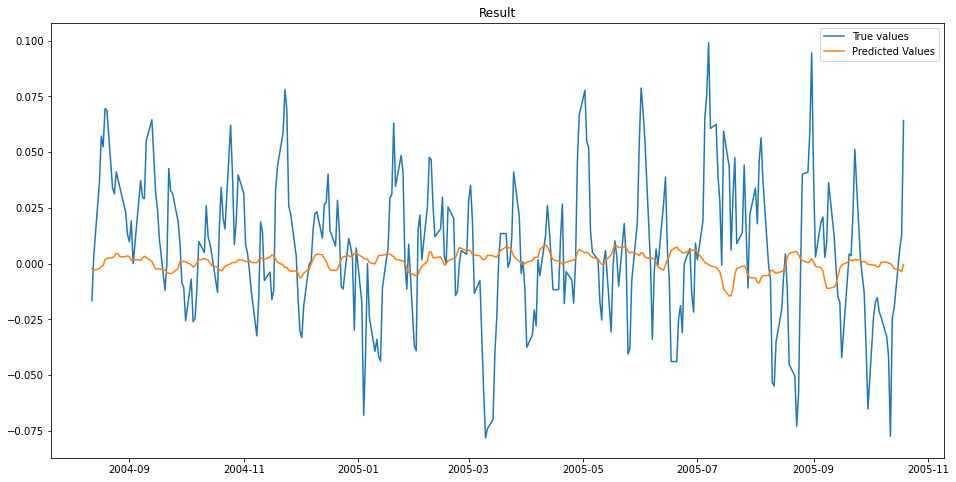


MSE: 0.001095034860491739

Iteration No: 97 ended. Search finished for the next optimal point.
Time taken: 17.5033
Function value obtained: 0.0011
Current minimum: 0.0007
Iteration No: 98 started. Searching for the next optimal point.

learning rate: 0.0009689623512861775
num_input_nodes: 188
dropout: 0.13185877397914303
sequence_length : 100
batch_size: 166



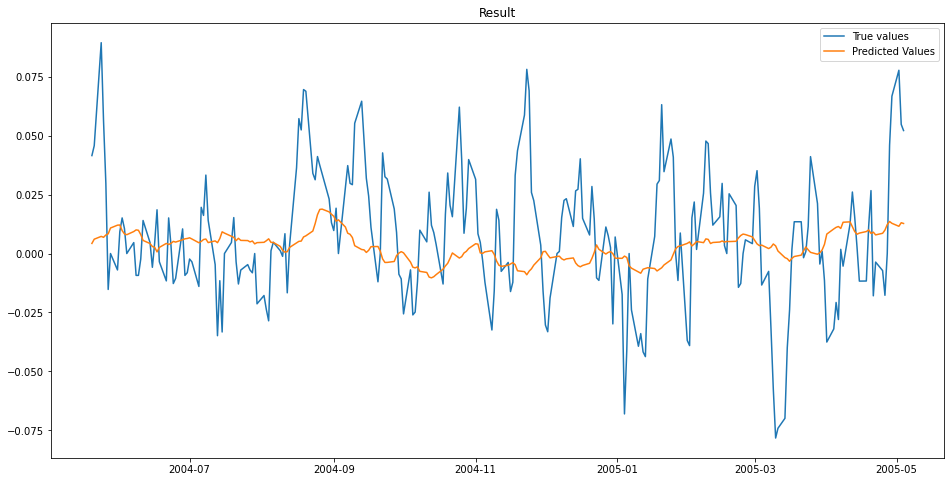


MSE: 0.0008030167659683368

Iteration No: 98 ended. Search finished for the next optimal point.
Time taken: 13.7448
Function value obtained: 0.0008
Current minimum: 0.0007
Iteration No: 99 started. Searching for the next optimal point.

learning rate: 0.0001776470640235275
num_input_nodes: 90
dropout: 0.20558607667066317
sequence_length : 100
batch_size: 210



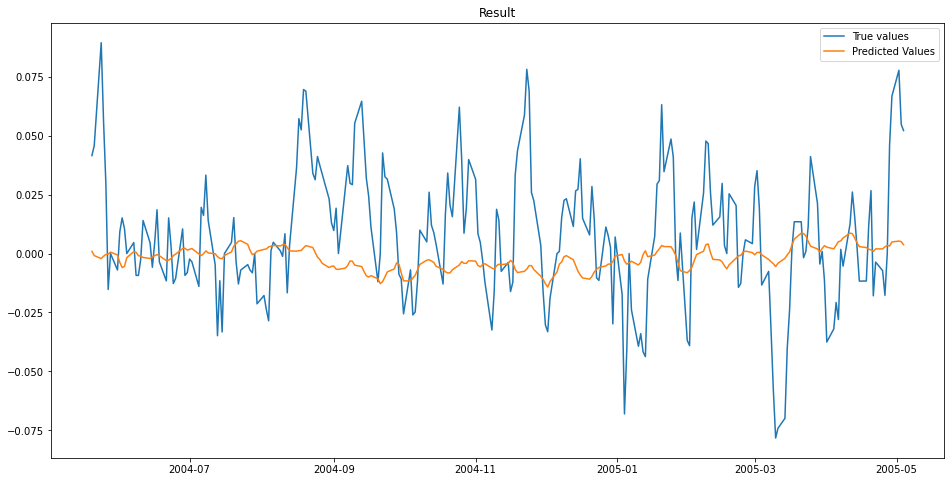


MSE: 0.0008601882550995173

Iteration No: 99 ended. Search finished for the next optimal point.
Time taken: 12.2503
Function value obtained: 0.0009
Current minimum: 0.0007
Iteration No: 100 started. Searching for the next optimal point.

learning rate: 0.00011721775002593032
num_input_nodes: 39
dropout: 0.12976722869907892
sequence_length : 174
batch_size: 136



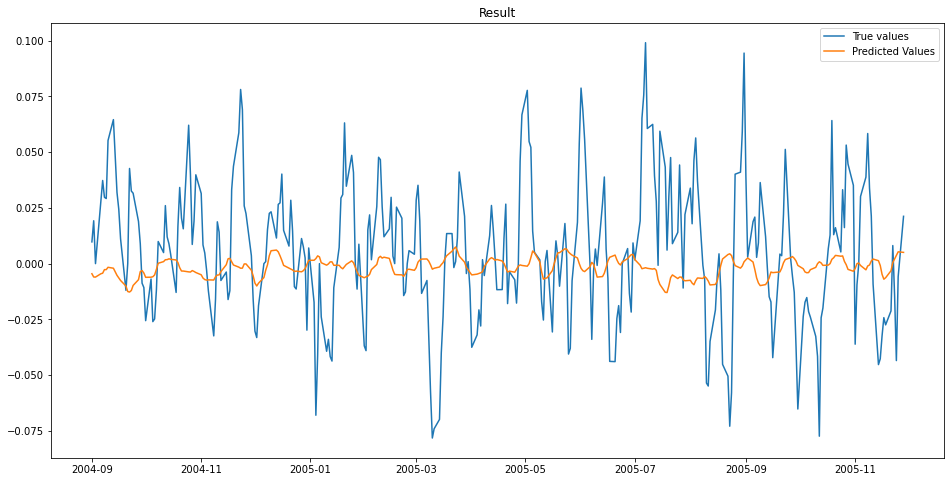


MSE: 0.001080987523944333

Iteration No: 100 ended. Search finished for the next optimal point.
Time taken: 16.8281
Function value obtained: 0.0011
Current minimum: 0.0007


In [10]:
gp_result = gp_minimize(func=fitness,
                            dimensions=dimensions,
                            n_jobs=-1,
                            n_random_starts=10,
                            verbose=True,
                            x0=default_parameters,
                            random_state=randseed)

**Summary of configurations and results**

In [11]:
res = pd.concat([pd.DataFrame(gp_result.x_iters, columns = ['learning_rate', 'num_input_nodes', 'dropout', 'sequencelength', 'batch_size']),(pd.Series(gp_result.func_vals, name="mse"))], axis=1)
res = res.sort_values(by='mse')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(res)

,learning_rate,num_input_nodes,dropout,sequencelength,batch_size,mse
86,0.005333,28,0.107300,105,246,0.000738
12,0.001106,247,0.239615,105,66,0.000759
49,0.001520,144,0.129239,107,181,0.000775
48,0.007320,256,0.250000,100,1,0.000795
97,0.000969,188,0.131859,100,166,0.000803
70,0.002884,16,0.250000,100,214,0.000804
58,0.000235,256,0.188472,100,1,0.000810
18,0.000229,76,0.250000,100,1,0.000814
4,0.001718,159,0.001767,102,132,0.000829
23,0.007718,256,0.040373,100,240,0.000829
